### Data Preparation & QC

In [1]:
library(Seurat)
library(ggplot2)
library(dplyr)
library(patchwork)
library(harmony)
library(tidyr)
library(DoubletFinder)

Loading required package: SeuratObject

Loading required package: sp

‘SeuratObject’ was built with package ‘Matrix’ 1.6.4 but the current
version is 1.6.5; it is recomended that you reinstall ‘SeuratObject’ as
the ABI for ‘Matrix’ may have changed


Attaching package: ‘SeuratObject’


The following object is masked from ‘package:base’:

    intersect



Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union


Loading required package: Rcpp



In [2]:
data.path <- "/cluster/home/t915857uhn/Howe_Analysis/outs/filtered_feature_bc_matrix"

In [3]:
seurat.object <- Read10X(data.dir = data.path)

In [4]:
howe <- CreateSeuratObject(counts = seurat.object, project = "howe",min.cells = 3, min.features = 200)

In [5]:
howe[["percent.mt"]] <- PercentageFeatureSet(howe, pattern = "^MT-")

In [6]:
# Adding a new column 'sample' based on the last character of rownames
# Data mapped from sample.meta.txt in RAW files

howe@meta.data$sample <- sapply(rownames(howe@meta.data), function(name) {
    identifier <- as.numeric(substring(name, nchar(name)))

    if (identifier == 1) {
      return("patient_1_PA")
    } else if (identifier == 2) {
      return("patient_1_AC")
    } else if (identifier == 3) {
      return("patient_2_PA")
    } else if (identifier == 4) {
      return("patient_2_AC")
    } else if (identifier == 5) {
      return("patient_3_PA")
    } else if (identifier == 6) {
      return("patient_3_AC")
    } else {
      return(NA)  # Return NA for unidentified cases
    }
  })

# Adding a new column 'patient' based on the last character of rownames
# Data mapped from sample.meta.txt in RAW files
howe@meta.data$patient <- sapply(rownames(howe@meta.data), function(name) {
    identifier <- as.numeric(substring(name, nchar(name)))

    if (identifier == 1) {
      return("patient_1")
    } else if (identifier == 2) {
      return("patient_1")
    } else if (identifier == 3) {
      return("patient_2")
    } else if (identifier == 4) {
      return("patient_2")
    } else if (identifier == 5) {
      return("patient_3")
    } else if (identifier == 6) {
      return("patient_3")
    } else {
      return(NA)  # Return NA for unidentified cases
    }
  })

# Adding a new column 'condition' based on the last character of rownames
# Data mapped from sample.meta.txt in RAW files

howe@meta.data$condition <- sapply(rownames(howe@meta.data), function(name) {
    identifier <- as.numeric(substring(name, nchar(name)))

    if (identifier == 1) {
      return("PA")
    } else if (identifier == 2) {
      return("AC")
    } else if (identifier == 3) {
      return("PA")
    } else if (identifier == 4) {
      return("AC")
    } else if (identifier == 5) {
      return("PA")
    } else if (identifier == 6) {
      return("AC")
    } else {
      return(NA)  # Return NA for unidentified cases
    }
  })


In [7]:
head(howe@meta.data,n=2)

,orig.ident,nCount_RNA,nFeature_RNA,percent.mt,sample,patient,condition
,<fct>,<dbl>,<int>,<dbl>,<chr>,<chr>,<chr>
AAACGAAAGATCCCAT-1,howe,7783,2325,3.880252,patient_1_PA,patient_1,PA
AAACGAACAGGCTACC-1,howe,4723,1645,3.175947,patient_1_PA,patient_1,PA


Warning message:
“Default search for "data" layer in "RNA" assay yielded no results; utilizing "counts" layer instead.”


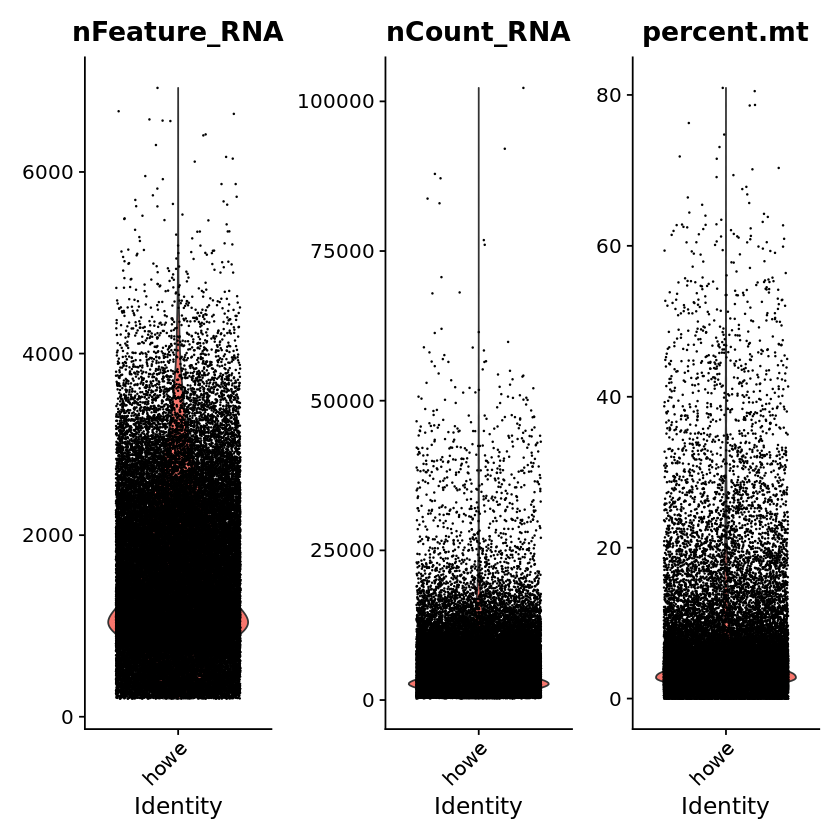

In [8]:
VlnPlot(howe, features = c("nFeature_RNA", "nCount_RNA", "percent.mt"), ncol = 3)

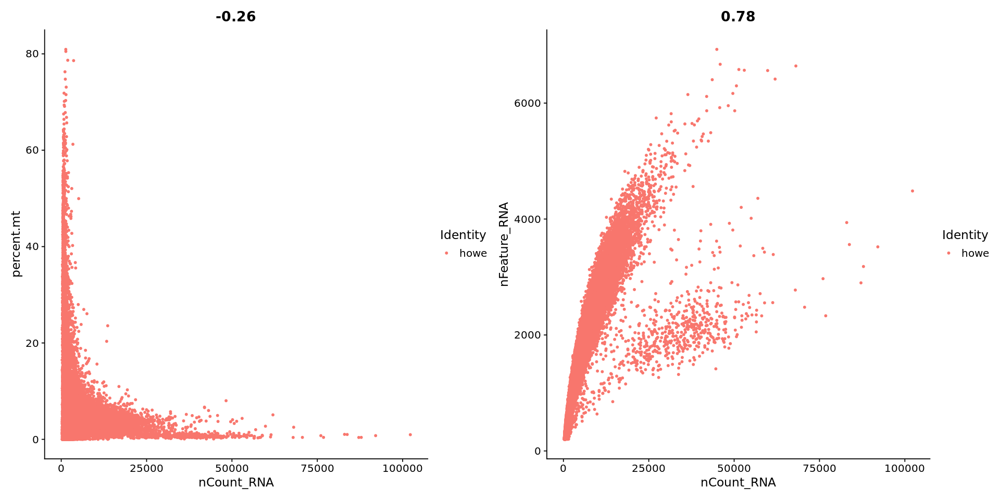

In [9]:
plot1 <- FeatureScatter(howe, feature1 = "nCount_RNA", feature2 = "percent.mt")
plot2 <- FeatureScatter(howe, feature1 = "nCount_RNA", feature2 = "nFeature_RNA")
plot1 + plot2

In [10]:
# Subsetting data based on mt genes. Alsaigh et al. used 10% mt, <4000 genes
# Seurat default: nFeature_RNA > 200 & nFeature_RNA < 2500 & percent.mt < 5

howe <- subset(howe, subset = nFeature_RNA > 200 & nFeature_RNA < 4000 & percent.mt < 10)

#### Downsampling

In [11]:
# Sample level down-sampling

split_seurat <- SplitObject(howe, split.by = "sample")
split_seurat[['patient_3_PA']]

An object of class Seurat 
23578 features across 2850 samples within 1 assay 
Active assay: RNA (23578 features, 0 variable features)
 1 layer present: counts

In [12]:
# Downsampling each subset based on lowest # of cells (2850)

for (i in names(split_seurat)) {
  cells_to_keep <- sample(Cells(split_seurat[[i]]), 2850)
  split_seurat[[i]] <- subset(split_seurat[[i]], cells = cells_to_keep)
}


In [13]:
split_seurat[['patient_1_AC']]

An object of class Seurat 
23578 features across 2850 samples within 1 assay 
Active assay: RNA (23578 features, 0 variable features)
 1 layer present: counts

In [14]:
howe <- merge(x = split_seurat[[1]], y = split_seurat[-1])

In [15]:
print(nrow(howe@meta.data))

[1] 17100


### Cell Type Annotation Workflow

In [16]:
howe <- SCTransform(howe, vars.to.regress = "percent.mt",verbose=FALSE)

In [17]:
# Generating UMAP. Harmony reduction by patient (data was batched by patient, not by sample)
howe <- RunPCA(howe, verbose = FALSE)
howe <- RunHarmony(howe, group.by.vars = 'patient', dims=1:30, verbose=FALSE)
howe <- RunUMAP(howe, reduction = "harmony", dims = 1:30, verbose = FALSE)

howe <- FindNeighbors(howe, reduction = "harmony", dims = 1:30, verbose = FALSE)
howe <- FindClusters(howe, resolution = 0.5, verbose = FALSE)

Warning message:
“The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session”
Found more than one class "dist" in cache; using the first, from namespace 'spam'

Also defined by ‘BiocGenerics’

Found more than one class "dist" in cache; using the first, from namespace 'spam'

Also defined by ‘BiocGenerics’



In [18]:
# Transforming SCT model for later DE analysis
howe <- PrepSCTFindMarkers(howe)

Found 6 SCT models. Recorrecting SCT counts using minimum median counts: 3556.5



In [20]:
# Save seurat object
saveRDS(howe, file = "/cluster/home/t915857uhn/Howe_Analysis/seurat_object.rds")

In [2]:
# Load seurat object
howe <- readRDS(file = "/cluster/home/t915857uhn/Howe_Analysis/seurat_object.rds")

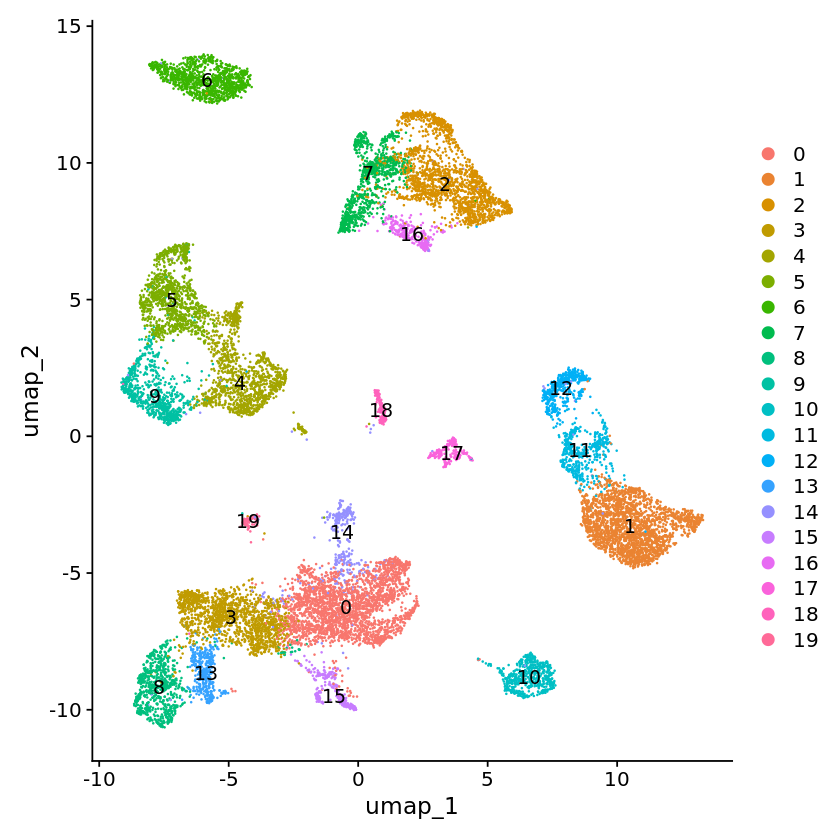

In [3]:
DimPlot(howe, label = TRUE)

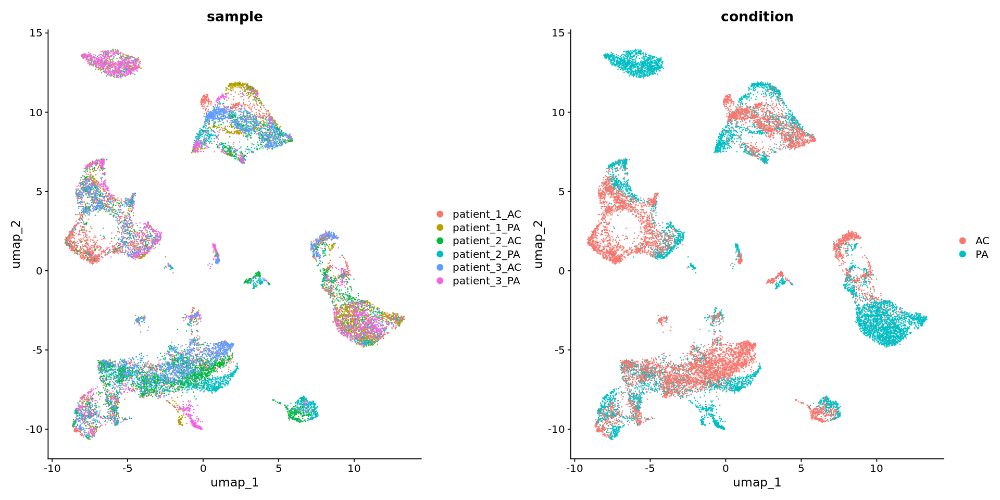

In [4]:
options(repr.plot.width=16, repr.plot.height=8)
DimPlot(howe, group.by='sample') + DimPlot(howe, group.by='condition')

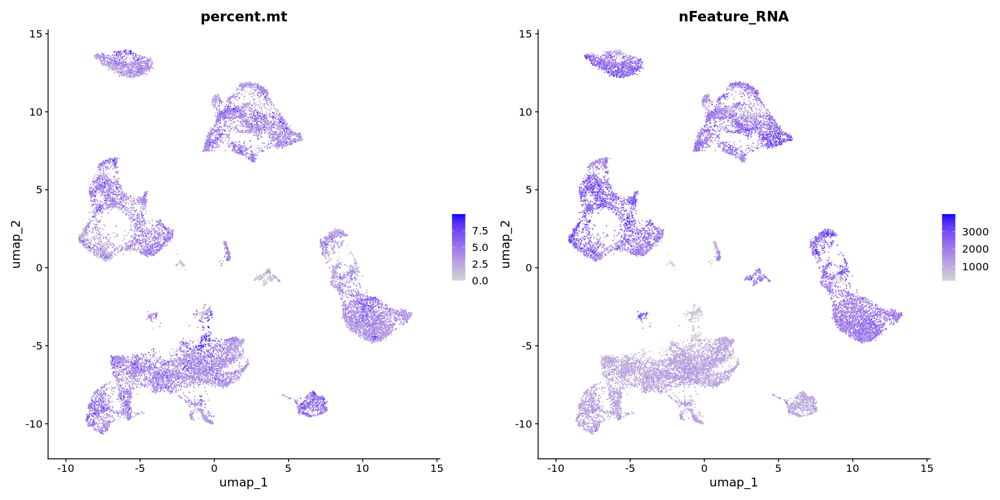

In [5]:
options(repr.plot.width=16, repr.plot.height=8)
FeaturePlot(howe, features=c('percent.mt','nFeature_RNA'))

In [6]:
#https://github.com/satijalab/seurat/issues/4884 or https://github.com/satijalab/seurat/issues/738

num_cells <- table(howe@active.ident)
num_cells


   0    1    2    3    4    5    6    7    8    9   10   11   12   13   14   15 
2508 2228 1814 1486 1236 1109 1089  887  751  744  540  464  448  385  381  277 
  16   17   18   19 
 277  227  175   74 

In [7]:
all.markers <- FindAllMarkers(howe, only.pos = TRUE,verbose=FALSE)

#howe.markers %>%
#    group_by(cluster) %>%
#    dplyr::filter(avg_log2FC > 2, p_val_adj <0.001)  %>%
#    slice_head(n = 2)

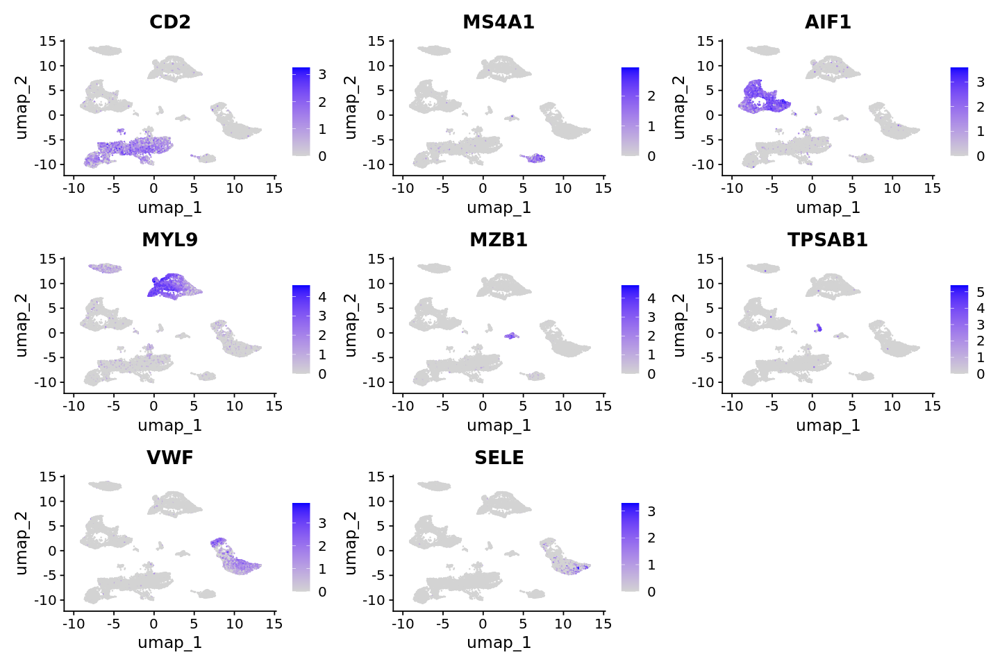

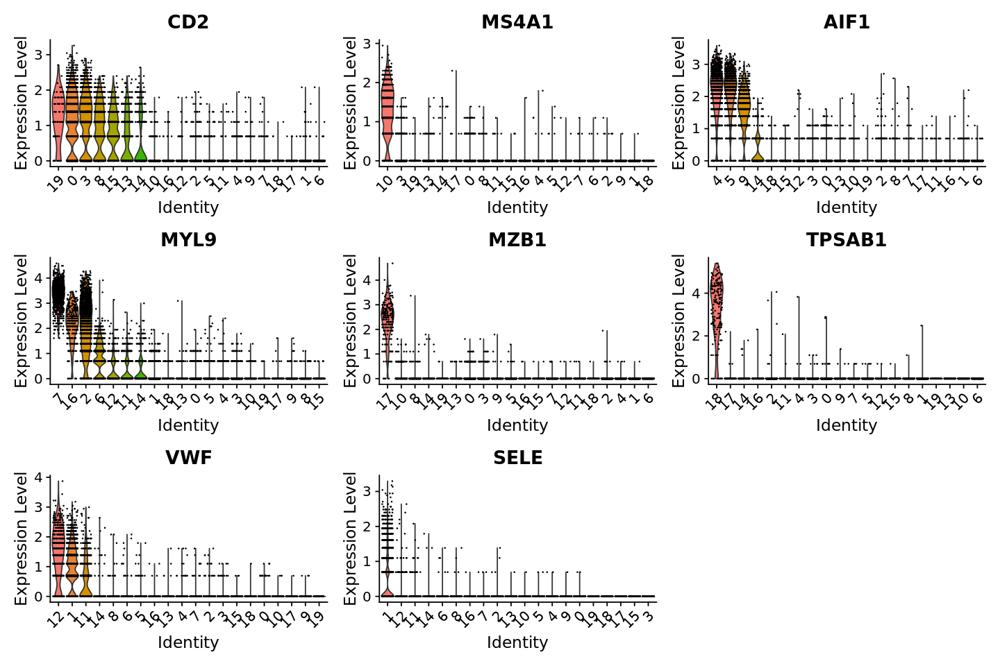

In [8]:
options(repr.plot.width=12, repr.plot.height=8)

# Marker genes represent broad cell classes
FeaturePlot(howe, features = c('CD2','MS4A1','AIF1','MYL9','MZB1','TPSAB1','VWF','SELE'))

VlnPlot(howe, features = c('CD2','MS4A1','AIF1','MYL9','MZB1','TPSAB1','VWF','SELE'),sort=TRUE)

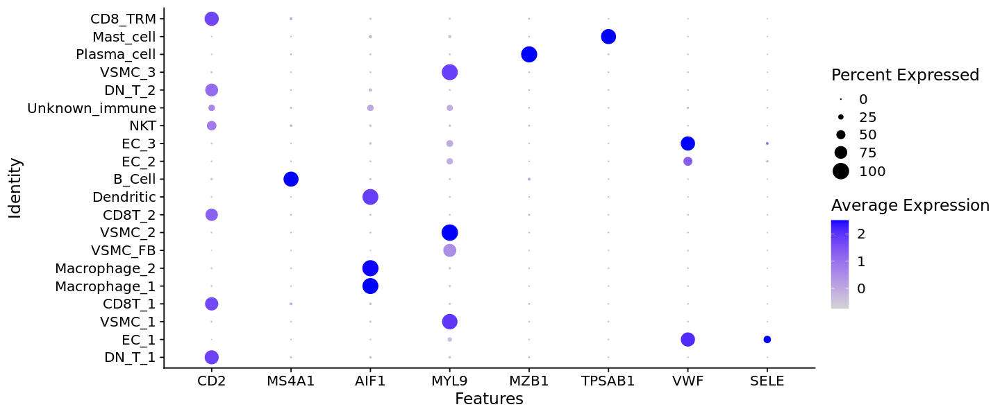

In [19]:
options(repr.plot.width=12, repr.plot.height=5)
DotPlot(object = howe, features = c('CD2','MS4A1','AIF1','MYL9','MZB1','TPSAB1','VWF','SELE'))

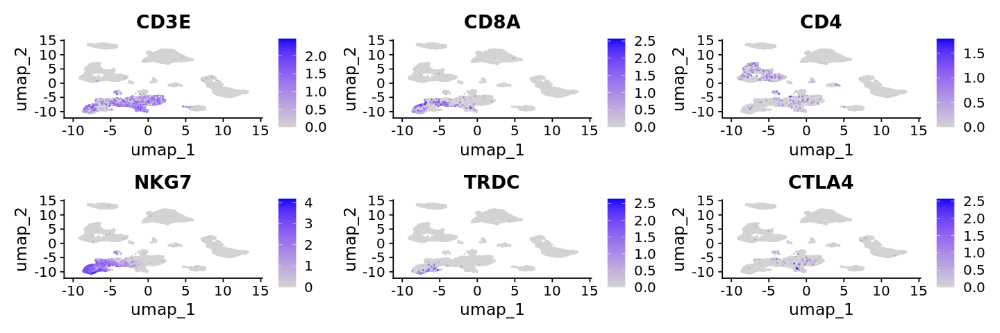

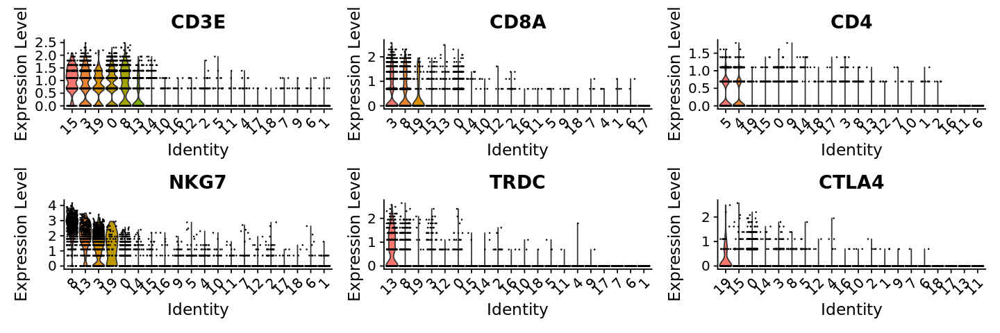

In [10]:
# Marker genes for T-cell specificity

FeaturePlot(howe, features = c('CD3E','CD8A','CD4','NKG7','TRDC','CTLA4'), pt.size = 0.2,
    ncol = 3)
VlnPlot(howe, features = c('CD3E','CD8A','CD4','NKG7','TRDC','CTLA4'),sort=TRUE)

In [11]:
specific_clusters <- c('14')

all.markers %>%
    group_by(cluster) %>%
    filter(cluster %in% specific_clusters, avg_log2FC > 0.5, p_val_adj < 0.2) %>%
    arrange(avg_log2FC) %>%
    slice_head(n = 15)

p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
2.124176e-17,0.8883675,0.774,0.646,3.837749e-13,14,SON
3.272774e-09,0.9781416,0.627,0.563,5.912920e-05,14,HNRNPU
4.055816e-102,1.4729131,1.000,1.000,7.327643e-98,14,MALAT1
1.003139e-07,2.1515084,0.136,0.073,1.812371e-03,14,ANKRD36C
6.004742e-56,2.2540888,0.984,0.724,1.084877e-51,14,NEAT1
8.668241e-12,3.1238225,0.066,0.018,1.566091e-07,14,TTN
8.941215e-06,4.6075568,0.010,0.001,1.615409e-01,14,BAIAP3


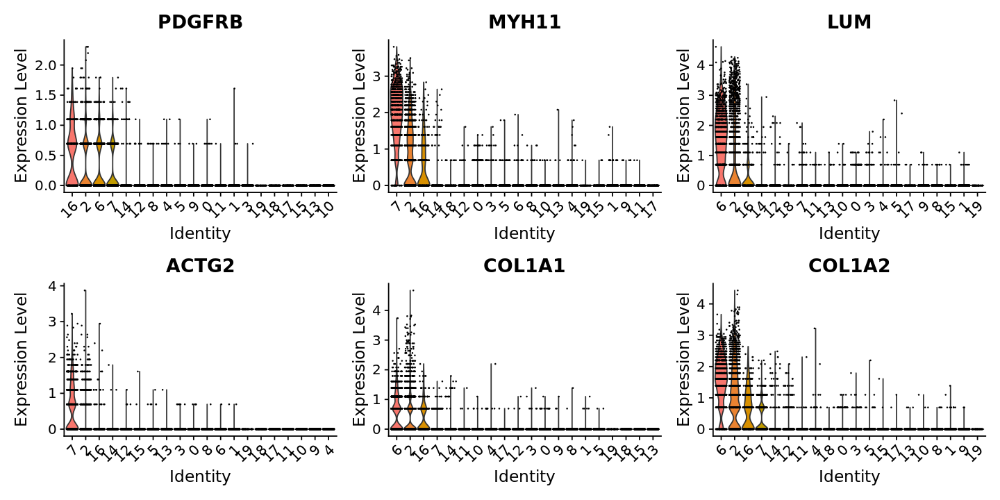

In [12]:
# Marker genes for Fibroblast/VSMC specificity; 
options(repr.plot.width=12, repr.plot.height=6)

VlnPlot(howe, features = c("PDGFRB","MYH11",'LUM','ACTG2','COL1A1','COL1A2'),sort=TRUE)

In [13]:
specific_clusters <- c('4','5','9')

all.markers %>%
    group_by(cluster) %>%
    filter(cluster %in% specific_clusters, avg_log2FC > 1, p_val_adj < 0.001) %>%
    mutate(difference = pct.1 - pct.2) %>% 
    arrange(desc(difference)) %>%
    slice_head(n = 5)

p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene,difference
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>,<dbl>
0,3.334083,0.969,0.157,0,4,AIF1,0.812
0,5.260539,0.943,0.140,0,4,LYZ,0.803
0,4.606154,0.864,0.092,0,4,MNDA,0.772
0,4.296091,0.850,0.093,0,4,LST1,0.757
0,6.951300,0.782,0.026,0,4,FCN1,0.756
0,6.974200,0.986,0.034,0,5,C1QC,0.952
0,6.901552,0.992,0.044,0,5,C1QA,0.948
0,7.160303,0.983,0.040,0,5,C1QB,0.943
0,4.277985,0.944,0.085,0,5,MS4A6A,0.859


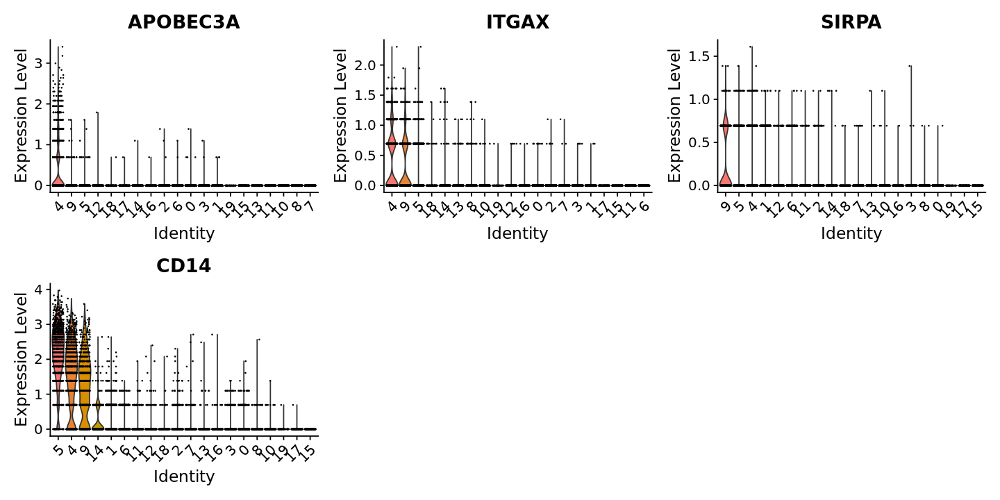

In [14]:
# Marker genes for Dendrite/Macrophage specificity; 
options(repr.plot.width=12, repr.plot.height=6)

VlnPlot(howe, features = c("APOBEC3A",'ITGAX','SIRPA','CD14'),sort=TRUE)

In [15]:
# DE Analysis comparing clusters against specific clusters (e.g., 0 vs 4, 7, 8)
cluster0.markers <- FindMarkers(howe, ident.1 = "0", ident.2 = c("4","7","8"))

cluster0.markers%>%
    filter(avg_log2FC > 1.5, p_val_adj < 0.001) %>%
    mutate(difference = pct.1 - pct.2) %>% 
    arrange(desc(difference)) %>%
    slice_head(n = 10)

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj,difference
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
IL7R,0.000000e+00,3.231998,0.885,0.129,0.000000e+00,0.756
IL32,0.000000e+00,2.001614,0.947,0.263,0.000000e+00,0.684
LTB,0.000000e+00,3.791101,0.777,0.121,0.000000e+00,0.656
CD69,0.000000e+00,2.948076,0.904,0.267,0.000000e+00,0.637
TRAC,0.000000e+00,2.032327,0.821,0.186,0.000000e+00,0.635
CD2,0.000000e+00,2.482124,0.842,0.211,0.000000e+00,0.631
CD3D,0.000000e+00,1.850809,0.801,0.189,0.000000e+00,0.612
CD3E,0.000000e+00,1.786897,0.758,0.191,0.000000e+00,0.567
TRBC2,0.000000e+00,2.238302,0.766,0.214,0.000000e+00,0.552


### Final Cell Type Annotations

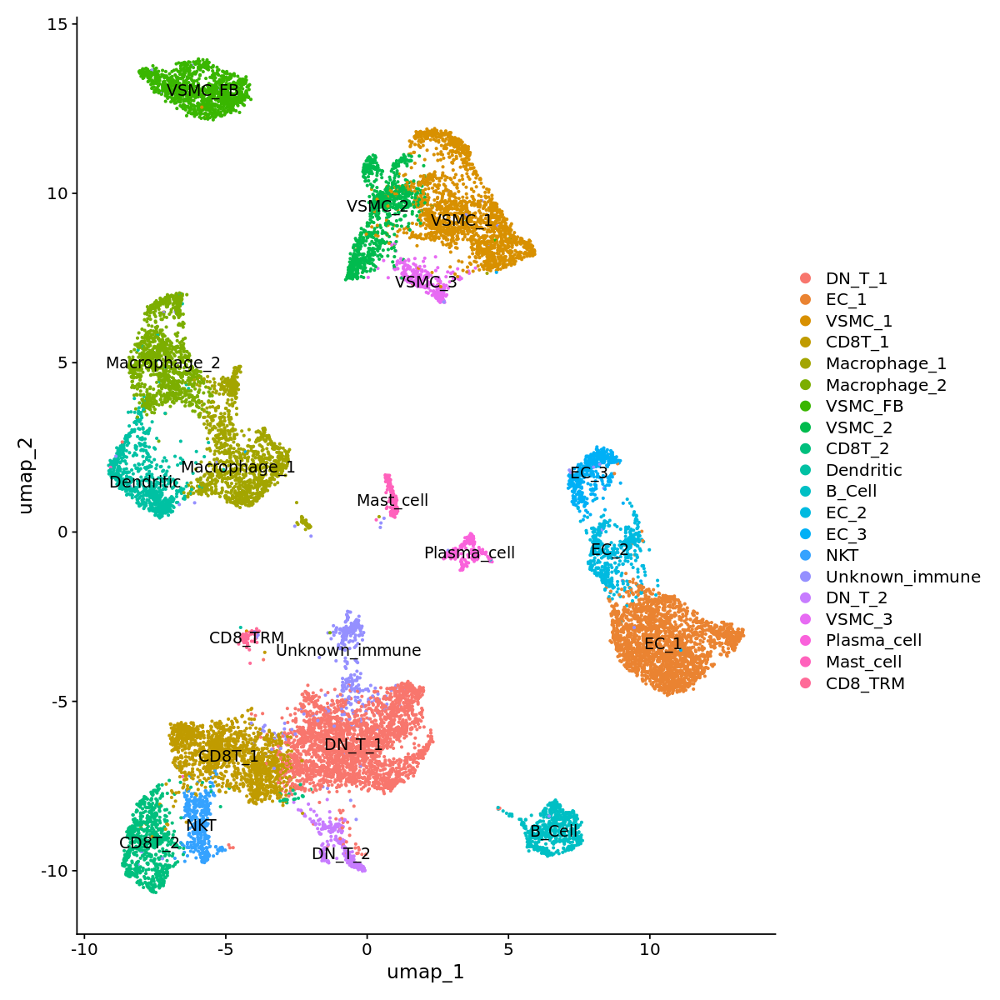

In [16]:
new.cluster.ids <- c(
  "DN_T_1",
  "EC_1",
  "VSMC_1",
  "CD8T_1",
  "Macrophage_1",
  "Macrophage_2",
  "VSMC_FB",
  "VSMC_2",
  "CD8T_2",
  "Dendritic",
  "B_Cell",
  "EC_2",
  "EC_3",
  "NKT",
  "Unknown_immune",
  "DN_T_2",
  "VSMC_3",
  "Plasma_cell",
  "Mast_cell",
  "CD8_TRM"
)

options(repr.plot.width=10, repr.plot.height=10)

names(new.cluster.ids) <- levels(howe)
howe <- RenameIdents(howe, new.cluster.ids)
DimPlot(howe, label = TRUE, pt.size = 0.5)

In [17]:
# Adds in a cell type column from current cluster identity
howe@meta.data$cell_type = howe@active.ident

In [17]:
celltype_count <- howe@meta.data %>%
  group_by(condition, cell_type) %>%
  summarise(count = n(), .groups = 'drop') %>%
  spread(key = cell_type, value = count)

# Viewing the table
as.data.frame(celltype_count)

condition,DN_T_1,EC_1,VSMC_1,CD8T_1,Macrophage_1,Macrophage_2,VSMC_FB,VSMC_2,CD8T_2,⋯,B_Cell,EC_2,EC_3,NKT,Unknown_immune,DN_T_2,VSMC_3,Plasma_cell,Mast_cell,CD8_TRM
<chr>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,⋯,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
AC,1826,112,1020,939,720,690,7,437,299,⋯,276,237,394,196,249,1,100,143,105,63
PA,682,2116,794,547,516,419,1082,450,452,⋯,264,227,54,189,132,276,177,84,70,11


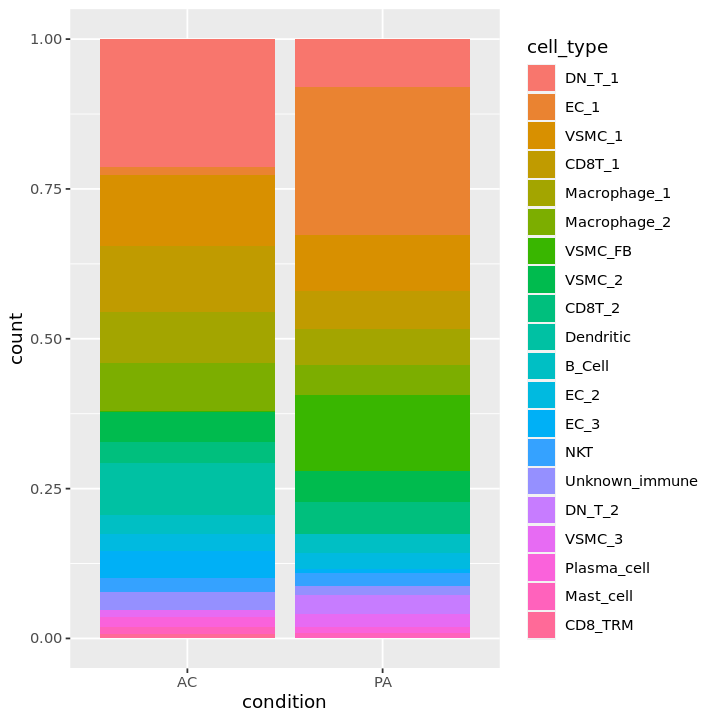

In [18]:
options(repr.plot.width=6, repr.plot.height=6)
ggplot(howe@meta.data, aes(x=condition, fill=cell_type)) +
    geom_bar(position="fill")

In [19]:
head(howe@meta.data,n=2)

,orig.ident,nCount_RNA,nFeature_RNA,percent.mt,sample,patient,condition,nCount_SCT,nFeature_SCT,SCT_snn_res.0.5,seurat_clusters,cell_type
,<chr>,<dbl>,<int>,<dbl>,<chr>,<chr>,<chr>,<dbl>,<int>,<fct>,<fct>,<fct>
AAACGAAAGATCCCAT-1,howe,7783,2325,3.880252,patient_1_PA,patient_1,PA,5423,2284,1,1,EC_1
AAACGAACAGGCTACC-1,howe,4723,1645,3.175947,patient_1_PA,patient_1,PA,4749,1631,2,2,VSMC_1


### Differential Expression Analysis

In [20]:
# DE between AC/PA
#howe.markers <- PrepSCTFindMarkers(howe)

# pseudobulk the counts based on donor-condition-celltype
pseudo_ifnb <- AggregateExpression(howe, assays = "RNA", return.seurat = T, group.by = c("patient", "condition", "cell_type"))

# each 'cell' is a donor-condition-celltype pseudobulk profile
tail(Cells(pseudo_ifnb))

Names of identity class contain underscores ('_'), replacing with dashes ('-')
This message is displayed once every 8 hours.


[1] "patient-3_PA_Unknown-immune" "patient-3_PA_DN-T-2"        
[3] "patient-3_PA_VSMC-3"         "patient-3_PA_Plasma-cell"   
[5] "patient-3_PA_Mast-cell"      "patient-3_PA_CD8-TRM"

In [21]:
pseudo_ifnb$celltype.cond <- paste(pseudo_ifnb$cell_type, pseudo_ifnb$condition, sep = "_")

In [22]:
# Perform DE analysis between identical cell types across condition (w/ Pseudo-bulking)
# Pseudo-bulking performed to decrease FP incidence

Idents(pseudo_ifnb) <- "celltype.cond"

bulk.mono.de <- FindMarkers(object = pseudo_ifnb, 
                         ident.1 = "VSMC-1_AC", 
                         ident.2 = "VSMC-1_PA",
                         test.use = "DESeq2")
head(bulk.mono.de, n = 5)

converting counts to integer mode

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates



,p_val,avg_log2FC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
IER3,4.421590e-13,2.368321,1,1.000,1.042522e-08
AREG,4.879567e-11,5.867896,1,0.333,1.150504e-06
C1QA,4.999709e-11,4.886132,1,1.000,1.178831e-06
LAPTM5,3.228169e-09,3.846455,1,1.000,7.611377e-05
GPR183,4.988177e-09,4.653442,1,0.667,1.176112e-04


### DoubletFinder Processing

In [164]:
mouse.split <- SplitObject(howe, split.by = "patient")

[1] "Sample 1"
[1] "Creating artificial doublets for pN = 5%"
[1] "Creating Seurat object..."
[1] "Running SCTransform..."


Running SCTransform on assay: RNA

Running SCTransform on layer: counts

vst.flavor='v2' set. Using model with fixed slope and excluding poisson genes.

Variance stabilizing transformation of count matrix of size 17448 by 6000

Model formula is y ~ log_umi

Get Negative Binomial regression parameters per gene

Using 2000 genes, 5000 cells

Found 60 outliers - those will be ignored in fitting/regularization step


Second step: Get residuals using fitted parameters for 17448 genes

Computing corrected count matrix for 17448 genes

Calculating gene attributes

Wall clock passed: Time difference of 41.58859 secs

Determine variable features

Centering data matrix

Getting residuals for block 1(of 2) for counts dataset

Getting residuals for block 2(of 2) for counts dataset

Centering data matrix

Finished calculating residuals for counts

Set default assay to SCT



[1] "Running PCA..."


PC_ 1 
Positive:  SPP1, FTL, APOE, CCL4, CCL4L2, APOC1, FABP5, CCL3, C1QB, FTH1 
	   C1QA, FABP4, C1QC, LYZ, HLA-DRA, TYROBP, CCL3L1, CSTB, HLA-DPA1, HLA-DRB1 
	   CD74, CCL2, AIF1, CTSD, HLA-DPB1, FCER1G, CXCL8, CD14, AREG, S100A9 
Negative:  CFD, DCN, MGP, SFRP2, IGFBP6, APOD, TAGLN, GSN, FBLN1, ACTA2 
	   CXCL14, IGFBP7, IGFBP5, MFAP5, PLA2G2A, SERPINF1, SLPI, WISP2, SFRP4, C1R 
	   ADH1B, MYL9, LUM, MFAP4, PI16, CCDC80, TPM2, CTGF, C11orf96, CALD1 
PC_ 2 
Positive:  CFD, DCN, SPP1, SFRP2, FTL, APOE, APOD, IGFBP6, FBLN1, APOC1 
	   FABP5, GSN, CXCL14, PLA2G2A, MFAP5, FTH1, SERPINF1, SLPI, FABP4, WISP2 
	   C1QB, PI16, CSTB, C1QA, SFRP4, CCL3, C1QC, CCL4L2, LUM, C1R 
Negative:  TAGLN, ACTA2, MYL9, TPM2, RGS5, IGFBP7, CALD1, PPP1R14A, SPARCL1, TPM1 
	   IGFBP2, NOV, FRZB, FHL1, ACKR1, MGP, DSTN, BGN, MYH10, MYH11 
	   ASPN, RAMP1, GNLY, ADIRF, MAP1B, NEXN, SOST, CCL5, ACTC1, ITLN1 
PC_ 3 
Positive:  CCL4, CCL4L2, GNLY, CCL5, NKG7, C1QB, CCL3, C1QA, C1QC, CCL3L1 
	   HLA-DPA1, HLA-DRA,

[1] "Calculating PC distance matrix..."
[1] "Defining neighborhoods..."
[1] "Computing pANN across all pK..."
[1] "pK = 0.005..."
[1] "pK = 0.01..."
[1] "pK = 0.02..."
[1] "pK = 0.03..."
[1] "pK = 0.04..."
[1] "pK = 0.05..."
[1] "pK = 0.06..."
[1] "pK = 0.07..."
[1] "pK = 0.08..."
[1] "pK = 0.09..."
[1] "pK = 0.1..."
[1] "pK = 0.11..."
[1] "pK = 0.12..."
[1] "pK = 0.13..."
[1] "pK = 0.14..."
[1] "pK = 0.15..."
[1] "pK = 0.16..."
[1] "pK = 0.17..."
[1] "pK = 0.18..."
[1] "pK = 0.19..."
[1] "pK = 0.2..."
[1] "pK = 0.21..."
[1] "pK = 0.22..."
[1] "pK = 0.23..."
[1] "pK = 0.24..."
[1] "pK = 0.25..."
[1] "pK = 0.26..."
[1] "pK = 0.27..."
[1] "pK = 0.28..."
[1] "pK = 0.29..."
[1] "pK = 0.3..."
[1] "Creating artificial doublets for pN = 10%"
[1] "Creating Seurat object..."
[1] "Running SCTransform..."


Running SCTransform on assay: RNA

Running SCTransform on layer: counts

vst.flavor='v2' set. Using model with fixed slope and excluding poisson genes.

Variance stabilizing transformation of count matrix of size 17668 by 6333

Model formula is y ~ log_umi

Get Negative Binomial regression parameters per gene

Using 2000 genes, 5000 cells

Found 46 outliers - those will be ignored in fitting/regularization step


Second step: Get residuals using fitted parameters for 17668 genes

Computing corrected count matrix for 17668 genes

Calculating gene attributes

Wall clock passed: Time difference of 42.6424 secs

Determine variable features

Centering data matrix

Getting residuals for block 1(of 2) for counts dataset

Getting residuals for block 2(of 2) for counts dataset

Centering data matrix

Finished calculating residuals for counts

Set default assay to SCT



[1] "Running PCA..."


PC_ 1 
Positive:  SPP1, APOE, FTL, CCL4, CCL4L2, APOC1, FABP5, CCL3, C1QB, FABP4 
	   FTH1, C1QA, C1QC, LYZ, TYROBP, HLA-DRA, CSTB, CCL3L1, HLA-DPA1, CD74 
	   HLA-DRB1, CCL2, AIF1, CTSD, CD14, FCER1G, CXCL8, AREG, HLA-DPB1, CD36 
Negative:  CFD, DCN, MGP, SFRP2, IGFBP6, APOD, TAGLN, GSN, FBLN1, ACTA2 
	   CXCL14, IGFBP5, IGFBP7, MFAP5, PLA2G2A, SERPINF1, SLPI, WISP2, SFRP4, C1R 
	   LUM, MYL9, ADH1B, PI16, MFAP4, CCDC80, TPM2, CTGF, C11orf96, TIMP3 
PC_ 2 
Positive:  CFD, DCN, SPP1, SFRP2, APOE, FTL, APOD, IGFBP6, APOC1, FBLN1 
	   FABP5, CXCL14, GSN, MFAP5, PLA2G2A, FABP4, SERPINF1, FTH1, SLPI, WISP2 
	   C1QB, PI16, SFRP4, CSTB, CCL3, CCL4L2, C1QA, C1QC, LUM, C1R 
Negative:  TAGLN, ACTA2, TPM2, MYL9, RGS5, IGFBP7, CALD1, PPP1R14A, TPM1, MGP 
	   IGFBP2, FHL1, SPARCL1, NOV, FRZB, ACKR1, BGN, DSTN, MYH10, MYH11 
	   RAMP1, ASPN, MAP1B, ADIRF, C11orf96, GNLY, NEXN, SOST, ACTC1, OGN 
PC_ 3 
Positive:  SPP1, TAGLN, FTL, FABP5, FABP4, APOC1, ACTA2, APOE, MGP, CSTB 
	   MYL9, TPM2, FTH1, C

[1] "Calculating PC distance matrix..."
[1] "Defining neighborhoods..."
[1] "Computing pANN across all pK..."
[1] "pK = 0.005..."
[1] "pK = 0.01..."
[1] "pK = 0.02..."
[1] "pK = 0.03..."
[1] "pK = 0.04..."
[1] "pK = 0.05..."
[1] "pK = 0.06..."
[1] "pK = 0.07..."
[1] "pK = 0.08..."
[1] "pK = 0.09..."
[1] "pK = 0.1..."
[1] "pK = 0.11..."
[1] "pK = 0.12..."
[1] "pK = 0.13..."
[1] "pK = 0.14..."
[1] "pK = 0.15..."
[1] "pK = 0.16..."
[1] "pK = 0.17..."
[1] "pK = 0.18..."
[1] "pK = 0.19..."
[1] "pK = 0.2..."
[1] "pK = 0.21..."
[1] "pK = 0.22..."
[1] "pK = 0.23..."
[1] "pK = 0.24..."
[1] "pK = 0.25..."
[1] "pK = 0.26..."
[1] "pK = 0.27..."
[1] "pK = 0.28..."
[1] "pK = 0.29..."
[1] "pK = 0.3..."
[1] "Creating artificial doublets for pN = 15%"
[1] "Creating Seurat object..."
[1] "Running SCTransform..."


Running SCTransform on assay: RNA

Running SCTransform on layer: counts

vst.flavor='v2' set. Using model with fixed slope and excluding poisson genes.

Variance stabilizing transformation of count matrix of size 17852 by 6706

Model formula is y ~ log_umi

Get Negative Binomial regression parameters per gene

Using 2000 genes, 5000 cells

Found 42 outliers - those will be ignored in fitting/regularization step


Second step: Get residuals using fitted parameters for 17852 genes

Computing corrected count matrix for 17852 genes

Calculating gene attributes

Wall clock passed: Time difference of 46.26167 secs

Determine variable features

Centering data matrix

Getting residuals for block 1(of 2) for counts dataset

Getting residuals for block 2(of 2) for counts dataset

Centering data matrix

Finished calculating residuals for counts

Set default assay to SCT



[1] "Running PCA..."


PC_ 1 
Positive:  SPP1, FTL, APOE, CCL4, CCL4L2, APOC1, FABP5, C1QB, FTH1, FABP4 
	   CCL3, C1QA, C1QC, HLA-DRA, TYROBP, LYZ, CSTB, CCL3L1, HLA-DPA1, HLA-DRB1 
	   CD74, CCL2, CTSD, AIF1, HLA-DPB1, FCER1G, AREG, CD14, CXCL8, RNASE1 
Negative:  CFD, DCN, MGP, SFRP2, APOD, IGFBP6, GSN, TAGLN, FBLN1, CXCL14 
	   IGFBP7, IGFBP5, ACTA2, MFAP5, SERPINF1, PLA2G2A, SLPI, WISP2, SFRP4, C1R 
	   ADH1B, LUM, MFAP4, CCDC80, MYL9, PI16, TPM2, SFRP1, TIMP3, CALD1 
PC_ 2 
Positive:  CFD, SPP1, DCN, FTL, SFRP2, APOE, APOD, APOC1, IGFBP6, FABP5 
	   FBLN1, GSN, FABP4, FTH1, CXCL14, MFAP5, PLA2G2A, SERPINF1, CSTB, SLPI 
	   WISP2, C1QB, SFRP4, PI16, C1QA, C1QC, TYROBP, CCL3, CTSD, LUM 
Negative:  TAGLN, ACTA2, MYL9, TPM2, RGS5, IGFBP7, CALD1, PPP1R14A, SPARCL1, MGP 
	   ACKR1, IGFBP2, TPM1, FRZB, NOV, FHL1, GNLY, DSTN, BGN, MYH10 
	   CCL5, MYH11, ADIRF, RAMP1, ASPN, MAP1B, ITLN1, NKG7, NEXN, CLU 
PC_ 3 
Positive:  SPP1, TAGLN, FTL, FABP5, FABP4, ACTA2, APOC1, MGP, APOE, CSTB 
	   MYL9, TPM2, FTH1, IGFB

[1] "Calculating PC distance matrix..."
[1] "Defining neighborhoods..."
[1] "Computing pANN across all pK..."
[1] "pK = 0.005..."
[1] "pK = 0.01..."
[1] "pK = 0.02..."
[1] "pK = 0.03..."
[1] "pK = 0.04..."
[1] "pK = 0.05..."
[1] "pK = 0.06..."
[1] "pK = 0.07..."
[1] "pK = 0.08..."
[1] "pK = 0.09..."
[1] "pK = 0.1..."
[1] "pK = 0.11..."
[1] "pK = 0.12..."
[1] "pK = 0.13..."
[1] "pK = 0.14..."
[1] "pK = 0.15..."
[1] "pK = 0.16..."
[1] "pK = 0.17..."
[1] "pK = 0.18..."
[1] "pK = 0.19..."
[1] "pK = 0.2..."
[1] "pK = 0.21..."
[1] "pK = 0.22..."
[1] "pK = 0.23..."
[1] "pK = 0.24..."
[1] "pK = 0.25..."
[1] "pK = 0.26..."
[1] "pK = 0.27..."
[1] "pK = 0.28..."
[1] "pK = 0.29..."
[1] "pK = 0.3..."
[1] "Creating artificial doublets for pN = 20%"
[1] "Creating Seurat object..."
[1] "Running SCTransform..."


Running SCTransform on assay: RNA

Running SCTransform on layer: counts

vst.flavor='v2' set. Using model with fixed slope and excluding poisson genes.

Variance stabilizing transformation of count matrix of size 18044 by 7125

Model formula is y ~ log_umi

Get Negative Binomial regression parameters per gene

Using 2000 genes, 5000 cells

Found 38 outliers - those will be ignored in fitting/regularization step


Second step: Get residuals using fitted parameters for 18044 genes

Computing corrected count matrix for 18044 genes

Calculating gene attributes

Wall clock passed: Time difference of 50.0699 secs

Determine variable features

Centering data matrix

Getting residuals for block 1(of 2) for counts dataset

Getting residuals for block 2(of 2) for counts dataset

Centering data matrix

Finished calculating residuals for counts

Set default assay to SCT



[1] "Running PCA..."


PC_ 1 
Positive:  SPP1, APOE, FTL, CCL4, CCL4L2, APOC1, FABP5, CCL3, C1QB, FABP4 
	   FTH1, C1QA, C1QC, HLA-DRA, LYZ, TYROBP, CSTB, CCL3L1, HLA-DPA1, HLA-DRB1 
	   CD74, CCL2, CTSD, AIF1, FCER1G, CD14, HLA-DPB1, RNASE1, CXCL8, AREG 
Negative:  CFD, DCN, MGP, SFRP2, APOD, IGFBP6, GSN, FBLN1, TAGLN, CXCL14 
	   IGFBP5, IGFBP7, MFAP5, ACTA2, SERPINF1, SLPI, PLA2G2A, SFRP4, WISP2, C1R 
	   ADH1B, LUM, MFAP4, CCDC80, MYL9, PI16, TIMP3, TPM2, CTGF, C1S 
PC_ 2 
Positive:  TAGLN, ACTA2, MYL9, TPM2, RGS5, IGFBP7, CALD1, MGP, PPP1R14A, SPARCL1 
	   ACKR1, TPM1, IGFBP2, GNLY, NOV, FHL1, FRZB, DSTN, BGN, CCL5 
	   ITLN1, MYH10, MYH11, ADIRF, RAMP1, ASPN, NKG7, MAP1B, NEXN, CLU 
Negative:  SPP1, CFD, DCN, APOE, FTL, SFRP2, APOD, APOC1, FABP5, IGFBP6 
	   FABP4, FBLN1, FTH1, GSN, CXCL14, CSTB, MFAP5, SERPINF1, PLA2G2A, SLPI 
	   WISP2, C1QB, SFRP4, CTSD, TYROBP, PI16, CCL3, C1QA, C1QC, CTSL 
PC_ 3 
Positive:  CCL4, CCL4L2, C1QB, GNLY, CCL3, C1QA, C1QC, CFD, CCL5, CCL3L1 
	   NKG7, HLA-DPA1, HLA-DRA,

[1] "Calculating PC distance matrix..."
[1] "Defining neighborhoods..."
[1] "Computing pANN across all pK..."
[1] "pK = 0.005..."
[1] "pK = 0.01..."
[1] "pK = 0.02..."
[1] "pK = 0.03..."
[1] "pK = 0.04..."
[1] "pK = 0.05..."
[1] "pK = 0.06..."
[1] "pK = 0.07..."
[1] "pK = 0.08..."
[1] "pK = 0.09..."
[1] "pK = 0.1..."
[1] "pK = 0.11..."
[1] "pK = 0.12..."
[1] "pK = 0.13..."
[1] "pK = 0.14..."
[1] "pK = 0.15..."
[1] "pK = 0.16..."
[1] "pK = 0.17..."
[1] "pK = 0.18..."
[1] "pK = 0.19..."
[1] "pK = 0.2..."
[1] "pK = 0.21..."
[1] "pK = 0.22..."
[1] "pK = 0.23..."
[1] "pK = 0.24..."
[1] "pK = 0.25..."
[1] "pK = 0.26..."
[1] "pK = 0.27..."
[1] "pK = 0.28..."
[1] "pK = 0.29..."
[1] "pK = 0.3..."
[1] "Creating artificial doublets for pN = 25%"
[1] "Creating Seurat object..."
[1] "Running SCTransform..."


Running SCTransform on assay: RNA

Running SCTransform on layer: counts

vst.flavor='v2' set. Using model with fixed slope and excluding poisson genes.

Variance stabilizing transformation of count matrix of size 18223 by 7600

Model formula is y ~ log_umi

Get Negative Binomial regression parameters per gene

Using 2000 genes, 5000 cells

Found 32 outliers - those will be ignored in fitting/regularization step


Second step: Get residuals using fitted parameters for 18223 genes

Computing corrected count matrix for 18223 genes

Calculating gene attributes

Wall clock passed: Time difference of 52.82499 secs

Determine variable features

Centering data matrix

Getting residuals for block 1(of 2) for counts dataset

Getting residuals for block 2(of 2) for counts dataset

Centering data matrix

Finished calculating residuals for counts

Set default assay to SCT



[1] "Running PCA..."


PC_ 1 
Positive:  SPP1, APOE, FTL, CCL4, APOC1, FABP5, CCL4L2, FABP4, FTH1, CCL3 
	   C1QB, C1QA, CSTB, C1QC, TYROBP, LYZ, HLA-DRA, CTSD, CCL2, CCL3L1 
	   HLA-DPA1, HLA-DRB1, CD74, AIF1, FCER1G, CTSB, RNASE1, CTSL, CD36, CD14 
Negative:  CFD, DCN, MGP, SFRP2, APOD, IGFBP6, TAGLN, GSN, FBLN1, ACTA2 
	   IGFBP7, IGFBP5, CXCL14, SERPINF1, MFAP5, PLA2G2A, SFRP4, SLPI, MYL9, C1R 
	   WISP2, ADH1B, MFAP4, CCDC80, LUM, TPM2, CALD1, C11orf96, PI16, CTGF 
PC_ 2 
Positive:  TAGLN, ACTA2, MYL9, TPM2, RGS5, GNLY, IGFBP7, ACKR1, SPARCL1, CCL5 
	   CALD1, PPP1R14A, IGFBP2, TPM1, NKG7, FRZB, FHL1, DSTN, NOV, ITLN1 
	   BGN, ADIRF, MYH10, MYH11, RAMP1, MAP1B, TM4SF1, ASPN, GZMA, NEXN 
Negative:  CFD, SPP1, DCN, APOE, FTL, SFRP2, APOD, IGFBP6, APOC1, FABP5 
	   FABP4, FBLN1, GSN, FTH1, CXCL14, CSTB, PLA2G2A, MFAP5, SERPINF1, SLPI 
	   SFRP4, WISP2, CTSD, PI16, C1R, TYROBP, CCDC80, LUM, CTSL, CCL2 
PC_ 3 
Positive:  CCL4, CCL4L2, C1QB, CCL3, CFD, GNLY, C1QA, C1QC, CCL5, CCL3L1 
	   HLA-DPA1, HLA-DRA, N

[1] "Calculating PC distance matrix..."
[1] "Defining neighborhoods..."
[1] "Computing pANN across all pK..."
[1] "pK = 0.005..."
[1] "pK = 0.01..."
[1] "pK = 0.02..."
[1] "pK = 0.03..."
[1] "pK = 0.04..."
[1] "pK = 0.05..."
[1] "pK = 0.06..."
[1] "pK = 0.07..."
[1] "pK = 0.08..."
[1] "pK = 0.09..."
[1] "pK = 0.1..."
[1] "pK = 0.11..."
[1] "pK = 0.12..."
[1] "pK = 0.13..."
[1] "pK = 0.14..."
[1] "pK = 0.15..."
[1] "pK = 0.16..."
[1] "pK = 0.17..."
[1] "pK = 0.18..."
[1] "pK = 0.19..."
[1] "pK = 0.2..."
[1] "pK = 0.21..."
[1] "pK = 0.22..."
[1] "pK = 0.23..."
[1] "pK = 0.24..."
[1] "pK = 0.25..."
[1] "pK = 0.26..."
[1] "pK = 0.27..."
[1] "pK = 0.28..."
[1] "pK = 0.29..."
[1] "pK = 0.3..."
[1] "Creating artificial doublets for pN = 30%"
[1] "Creating Seurat object..."
[1] "Running SCTransform..."


Running SCTransform on assay: RNA

Running SCTransform on layer: counts

vst.flavor='v2' set. Using model with fixed slope and excluding poisson genes.

Variance stabilizing transformation of count matrix of size 18447 by 8143

Model formula is y ~ log_umi

Get Negative Binomial regression parameters per gene

Using 2000 genes, 5000 cells

Found 38 outliers - those will be ignored in fitting/regularization step


Second step: Get residuals using fitted parameters for 18447 genes

Computing corrected count matrix for 18447 genes

Calculating gene attributes

Wall clock passed: Time difference of 56.07859 secs

Determine variable features

Centering data matrix

Getting residuals for block 1(of 2) for counts dataset

Getting residuals for block 2(of 2) for counts dataset

Centering data matrix

Finished calculating residuals for counts

Set default assay to SCT



[1] "Running PCA..."


PC_ 1 
Positive:  CFD, DCN, MGP, SFRP2, IGFBP6, APOD, GSN, FBLN1, TAGLN, IGFBP5 
	   CXCL14, IGFBP7, ACTA2, SERPINF1, MFAP5, C1R, SFRP4, SLPI, PLA2G2A, WISP2 
	   ADH1B, MFAP4, CCDC80, LUM, TIMP3, MYL9, PI16, C11orf96, CTGF, TPM2 
Negative:  SPP1, APOE, FTL, CCL4, CCL4L2, APOC1, FABP5, FABP4, CCL3, C1QB 
	   FTH1, C1QA, C1QC, CSTB, HLA-DRA, TYROBP, LYZ, HLA-DPA1, CCL3L1, CD74 
	   HLA-DRB1, CCL2, CTSD, AIF1, CD36, FCER1G, CD14, CTSB, CTSL, RNASE1 
PC_ 2 
Positive:  TAGLN, ACTA2, TPM2, MYL9, IGFBP7, RGS5, CALD1, MGP, ACKR1, GNLY 
	   PPP1R14A, SPARCL1, IGFBP2, TPM1, FHL1, CCL5, FRZB, ITLN1, BGN, NOV 
	   DSTN, NKG7, MYH10, ADIRF, RAMP1, MYH11, MAP1B, ASPN, CLU, TM4SF1 
Negative:  SPP1, CFD, DCN, APOE, FTL, SFRP2, APOD, APOC1, FABP4, IGFBP6 
	   FABP5, FBLN1, FTH1, GSN, CSTB, CXCL14, SERPINF1, MFAP5, PLA2G2A, SLPI 
	   CTSD, SFRP4, C1QB, WISP2, TYROBP, CTSL, CD36, CTSB, CCL3, C1R 
PC_ 3 
Positive:  SPP1, TAGLN, ACTA2, FABP4, MGP, FABP5, FTL, APOC1, MYL9, TPM2 
	   APOE, CSTB, IGFBP7, RGS

[1] "Calculating PC distance matrix..."
[1] "Defining neighborhoods..."
[1] "Computing pANN across all pK..."
[1] "pK = 0.005..."
[1] "pK = 0.01..."
[1] "pK = 0.02..."
[1] "pK = 0.03..."
[1] "pK = 0.04..."
[1] "pK = 0.05..."
[1] "pK = 0.06..."
[1] "pK = 0.07..."
[1] "pK = 0.08..."
[1] "pK = 0.09..."
[1] "pK = 0.1..."
[1] "pK = 0.11..."
[1] "pK = 0.12..."
[1] "pK = 0.13..."
[1] "pK = 0.14..."
[1] "pK = 0.15..."
[1] "pK = 0.16..."
[1] "pK = 0.17..."
[1] "pK = 0.18..."
[1] "pK = 0.19..."
[1] "pK = 0.2..."
[1] "pK = 0.21..."
[1] "pK = 0.22..."
[1] "pK = 0.23..."
[1] "pK = 0.24..."
[1] "pK = 0.25..."
[1] "pK = 0.26..."
[1] "pK = 0.27..."
[1] "pK = 0.28..."
[1] "pK = 0.29..."
[1] "pK = 0.3..."
NULL
[1] "Creating 1900 artificial doublets..."
[1] "Creating Seurat object..."
[1] "Running SCTransform..."


Running SCTransform on assay: RNA

Running SCTransform on layer: counts

vst.flavor='v2' set. Using model with fixed slope and excluding poisson genes.

Variance stabilizing transformation of count matrix of size 18223 by 7600

Model formula is y ~ log_umi

Get Negative Binomial regression parameters per gene

Using 2000 genes, 5000 cells

Found 32 outliers - those will be ignored in fitting/regularization step


Second step: Get residuals using fitted parameters for 18223 genes

Computing corrected count matrix for 18223 genes

Calculating gene attributes

Wall clock passed: Time difference of 54.22734 secs

Determine variable features

Centering data matrix

Getting residuals for block 1(of 2) for counts dataset

Getting residuals for block 2(of 2) for counts dataset

Centering data matrix

Finished calculating residuals for counts

Set default assay to SCT



[1] "Running PCA..."


PC_ 1 
Positive:  SPP1, APOE, FTL, CCL4, APOC1, FABP5, CCL4L2, FABP4, FTH1, CCL3 
	   C1QB, C1QA, CSTB, C1QC, TYROBP, LYZ, HLA-DRA, CTSD, CCL2, CCL3L1 
	   HLA-DPA1, HLA-DRB1, CD74, AIF1, FCER1G, CTSB, RNASE1, CTSL, CD36, CD14 
Negative:  CFD, DCN, MGP, SFRP2, APOD, IGFBP6, TAGLN, GSN, FBLN1, ACTA2 
	   IGFBP7, IGFBP5, CXCL14, SERPINF1, MFAP5, PLA2G2A, SFRP4, SLPI, MYL9, C1R 
	   WISP2, ADH1B, MFAP4, CCDC80, LUM, TPM2, CALD1, C11orf96, PI16, CTGF 
PC_ 2 
Positive:  TAGLN, ACTA2, MYL9, TPM2, RGS5, GNLY, IGFBP7, ACKR1, SPARCL1, CCL5 
	   CALD1, PPP1R14A, IGFBP2, TPM1, NKG7, FRZB, FHL1, DSTN, NOV, ITLN1 
	   BGN, ADIRF, MYH10, MYH11, RAMP1, MAP1B, TM4SF1, ASPN, GZMA, NEXN 
Negative:  CFD, SPP1, DCN, APOE, FTL, SFRP2, APOD, IGFBP6, APOC1, FABP5 
	   FABP4, FBLN1, GSN, FTH1, CXCL14, CSTB, PLA2G2A, MFAP5, SERPINF1, SLPI 
	   SFRP4, WISP2, CTSD, PI16, C1R, TYROBP, CCDC80, LUM, CTSL, CCL2 
PC_ 3 
Positive:  CCL4, CCL4L2, C1QB, CCL3, CFD, GNLY, C1QA, C1QC, CCL5, CCL3L1 
	   HLA-DPA1, HLA-DRA, N

[1] "Calculating PC distance matrix..."
[1] "Computing pANN..."
[1] "Classifying doublets.."
[1] "Sample 2"
[1] "Creating artificial doublets for pN = 5%"
[1] "Creating Seurat object..."
[1] "Running SCTransform..."


Running SCTransform on assay: RNA

Running SCTransform on layer: counts

vst.flavor='v2' set. Using model with fixed slope and excluding poisson genes.

Variance stabilizing transformation of count matrix of size 17511 by 6000

Model formula is y ~ log_umi

Get Negative Binomial regression parameters per gene

Using 2000 genes, 5000 cells

Found 41 outliers - those will be ignored in fitting/regularization step


Second step: Get residuals using fitted parameters for 17511 genes

Computing corrected count matrix for 17511 genes

Calculating gene attributes

Wall clock passed: Time difference of 40.04843 secs

Determine variable features

Centering data matrix

Getting residuals for block 1(of 2) for counts dataset

Getting residuals for block 2(of 2) for counts dataset

Centering data matrix

Finished calculating residuals for counts

Set default assay to SCT



[1] "Running PCA..."


PC_ 1 
Positive:  MGP, TAGLN, IGFBP7, DCN, ACTA2, SFRP2, LUM, CTGF, C11orf96, MYL9 
	   TPM2, TIMP1, BGN, CALD1, CYR61, FBLN1, CCL19, IGFBP6, PLA2G2A, SFRP4 
	   CXCL14, IGFBP5, CCDC80, C1R, COL1A2, GSN, CLU, CFD, SLPI, SOD3 
Negative:  CCL4, CCL4L2, CCL3, HLA-DRA, C1QB, C1QA, LYZ, C1QC, HLA-DPA1, CD74 
	   TYROBP, S100A9, AIF1, CCL3L1, CD14, HLA-DPB1, HLA-DQA1, FCER1G, S100A8, HLA-DRB1 
	   FTL, CCL5, HLA-DRB5, CXCL8, AREG, IGKC, IL1B, SRGN, GZMK, GNLY 
PC_ 2 
Positive:  C1QB, C1QA, CCL3, HLA-DRA, C1QC, LYZ, FTL, S100A9, HLA-DPA1, CD14 
	   AIF1, TYROBP, MGP, CCL4L2, CD74, HLA-DRB1, FCER1G, S100A8, CCL3L1, HLA-DQA1 
	   HLA-DRB5, HLA-DPB1, FTH1, CXCL8, CFD, SELENOP, APOE, DCN, CXCL3, IL1B 
Negative:  IGKC, JCHAIN, GNLY, CCL5, IGHA1, IGHG1, IGLC2, IGHG3, MZB1, GZMK 
	   IL7R, IGHG2, CD69, NKG7, IL32, GZMA, TRBC2, CD2, TRBC1, BTG1 
	   IGHG4, LTB, TRAC, DUSP2, TSC22D3, CXCR4, ZFP36L2, CD3D, CST7, DDIT4 
PC_ 3 
Positive:  DCN, PLA2G2A, CFD, FBLN1, CXCL14, SFRP2, MGP, SFRP4, C3, PI16 
	  

[1] "Calculating PC distance matrix..."
[1] "Defining neighborhoods..."
[1] "Computing pANN across all pK..."
[1] "pK = 0.005..."
[1] "pK = 0.01..."
[1] "pK = 0.02..."
[1] "pK = 0.03..."
[1] "pK = 0.04..."
[1] "pK = 0.05..."
[1] "pK = 0.06..."
[1] "pK = 0.07..."
[1] "pK = 0.08..."
[1] "pK = 0.09..."
[1] "pK = 0.1..."
[1] "pK = 0.11..."
[1] "pK = 0.12..."
[1] "pK = 0.13..."
[1] "pK = 0.14..."
[1] "pK = 0.15..."
[1] "pK = 0.16..."
[1] "pK = 0.17..."
[1] "pK = 0.18..."
[1] "pK = 0.19..."
[1] "pK = 0.2..."
[1] "pK = 0.21..."
[1] "pK = 0.22..."
[1] "pK = 0.23..."
[1] "pK = 0.24..."
[1] "pK = 0.25..."
[1] "pK = 0.26..."
[1] "pK = 0.27..."
[1] "pK = 0.28..."
[1] "pK = 0.29..."
[1] "pK = 0.3..."
[1] "Creating artificial doublets for pN = 10%"
[1] "Creating Seurat object..."
[1] "Running SCTransform..."


Running SCTransform on assay: RNA

Running SCTransform on layer: counts

vst.flavor='v2' set. Using model with fixed slope and excluding poisson genes.

Variance stabilizing transformation of count matrix of size 17719 by 6333

Model formula is y ~ log_umi

Get Negative Binomial regression parameters per gene

Using 2000 genes, 5000 cells

Found 35 outliers - those will be ignored in fitting/regularization step


Second step: Get residuals using fitted parameters for 17719 genes

Computing corrected count matrix for 17719 genes

Calculating gene attributes

Wall clock passed: Time difference of 42.22492 secs

Determine variable features

Centering data matrix

Getting residuals for block 1(of 2) for counts dataset

Getting residuals for block 2(of 2) for counts dataset

Centering data matrix

Finished calculating residuals for counts

Set default assay to SCT



[1] "Running PCA..."


PC_ 1 
Positive:  MGP, TAGLN, IGFBP7, DCN, ACTA2, SFRP2, LUM, CTGF, C11orf96, MYL9 
	   TPM2, TIMP1, CALD1, BGN, CYR61, CCL19, IGFBP6, PLA2G2A, FBLN1, IGFBP5 
	   SFRP4, CXCL14, CCDC80, C1R, COL1A2, GSN, CFD, CLU, SOD3, FN1 
Negative:  CCL4, CCL4L2, CCL3, HLA-DRA, C1QB, C1QA, LYZ, C1QC, HLA-DPA1, CD74 
	   TYROBP, S100A9, AIF1, HLA-DPB1, CD14, CCL3L1, HLA-DQA1, FCER1G, S100A8, HLA-DRB1 
	   HLA-DRB5, FTL, CCL5, AREG, IGKC, CXCL8, SRGN, IL1B, GNLY, SPP1 
PC_ 2 
Positive:  IGKC, JCHAIN, IGHG1, GNLY, IGHA1, IGHG3, IGLC2, CCL5, IGHG2, MZB1 
	   IL7R, GZMK, CD69, NKG7, IL32, GZMA, TRBC2, IGHG4, CD2, LTB 
	   TRBC1, BTG1, TRAC, DUSP2, TSC22D3, ZFP36L2, CXCR4, CD3D, CST7, DDIT4 
Negative:  C1QB, C1QA, CCL3, HLA-DRA, C1QC, LYZ, FTL, HLA-DPA1, S100A9, CD14 
	   AIF1, TYROBP, MGP, CCL4L2, CD74, HLA-DRB1, FCER1G, S100A8, HLA-DRB5, CCL3L1 
	   HLA-DPB1, HLA-DQA1, FTH1, SELENOP, CFD, APOE, CXCL8, DCN, CXCL3, SPP1 
PC_ 3 
Positive:  DCN, PLA2G2A, CFD, CXCL14, FBLN1, SFRP2, MGP, SFRP4, C3, IGFBP6 
	 

[1] "Calculating PC distance matrix..."
[1] "Defining neighborhoods..."
[1] "Computing pANN across all pK..."
[1] "pK = 0.005..."
[1] "pK = 0.01..."
[1] "pK = 0.02..."
[1] "pK = 0.03..."
[1] "pK = 0.04..."
[1] "pK = 0.05..."
[1] "pK = 0.06..."
[1] "pK = 0.07..."
[1] "pK = 0.08..."
[1] "pK = 0.09..."
[1] "pK = 0.1..."
[1] "pK = 0.11..."
[1] "pK = 0.12..."
[1] "pK = 0.13..."
[1] "pK = 0.14..."
[1] "pK = 0.15..."
[1] "pK = 0.16..."
[1] "pK = 0.17..."
[1] "pK = 0.18..."
[1] "pK = 0.19..."
[1] "pK = 0.2..."
[1] "pK = 0.21..."
[1] "pK = 0.22..."
[1] "pK = 0.23..."
[1] "pK = 0.24..."
[1] "pK = 0.25..."
[1] "pK = 0.26..."
[1] "pK = 0.27..."
[1] "pK = 0.28..."
[1] "pK = 0.29..."
[1] "pK = 0.3..."
[1] "Creating artificial doublets for pN = 15%"
[1] "Creating Seurat object..."
[1] "Running SCTransform..."


Running SCTransform on assay: RNA

Running SCTransform on layer: counts

vst.flavor='v2' set. Using model with fixed slope and excluding poisson genes.

Variance stabilizing transformation of count matrix of size 17963 by 6706

Model formula is y ~ log_umi

Get Negative Binomial regression parameters per gene

Using 2000 genes, 5000 cells

Found 39 outliers - those will be ignored in fitting/regularization step


Second step: Get residuals using fitted parameters for 17963 genes

Computing corrected count matrix for 17963 genes

Calculating gene attributes

Wall clock passed: Time difference of 47.83329 secs

Determine variable features

Centering data matrix

Getting residuals for block 1(of 2) for counts dataset

Getting residuals for block 2(of 2) for counts dataset

Centering data matrix

Finished calculating residuals for counts

Set default assay to SCT



[1] "Running PCA..."


PC_ 1 
Positive:  MGP, TAGLN, IGFBP7, DCN, ACTA2, SFRP2, LUM, CTGF, C11orf96, MYL9 
	   TPM2, TIMP1, CCL19, BGN, PLA2G2A, CYR61, CALD1, IGFBP6, FBLN1, CXCL14 
	   CFD, SFRP4, IGFBP5, CCDC80, C1R, GSN, COL1A2, CLU, FN1, SOD3 
Negative:  CCL4, CCL4L2, CCL3, HLA-DRA, C1QB, C1QA, LYZ, C1QC, HLA-DPA1, CD74 
	   S100A9, TYROBP, AIF1, S100A8, HLA-DPB1, CCL3L1, CD14, HLA-DQA1, IGKC, HLA-DRB1 
	   FCER1G, CCL5, FTL, HLA-DRB5, AREG, CXCL8, SRGN, SPP1, GNLY, GZMK 
PC_ 2 
Positive:  IGKC, JCHAIN, IGHG1, IGHG3, IGHA1, IGLC2, IGHG2, MZB1, GNLY, CCL5 
	   IL7R, IGHG4, GZMK, CD69, IL32, NKG7, GZMA, TRBC2, CD2, TRBC1 
	   BTG1, LTB, TRAC, TSC22D3, IGLC3, DUSP2, ZFP36L2, CXCR4, CD3D, DERL3 
Negative:  C1QB, C1QA, CCL3, HLA-DRA, LYZ, C1QC, FTL, S100A9, HLA-DPA1, TYROBP 
	   MGP, AIF1, CD14, CCL4L2, S100A8, CD74, HLA-DRB1, FCER1G, HLA-DPB1, HLA-DRB5 
	   FTH1, CCL3L1, HLA-DQA1, CFD, DCN, APOE, SELENOP, CXCL8, SPP1, CST3 
PC_ 3 
Positive:  DCN, CFD, PLA2G2A, CXCL14, FBLN1, SFRP2, MGP, SFRP4, C3, APOD 
	   

[1] "Calculating PC distance matrix..."
[1] "Defining neighborhoods..."
[1] "Computing pANN across all pK..."
[1] "pK = 0.005..."
[1] "pK = 0.01..."
[1] "pK = 0.02..."
[1] "pK = 0.03..."
[1] "pK = 0.04..."
[1] "pK = 0.05..."
[1] "pK = 0.06..."
[1] "pK = 0.07..."
[1] "pK = 0.08..."
[1] "pK = 0.09..."
[1] "pK = 0.1..."
[1] "pK = 0.11..."
[1] "pK = 0.12..."
[1] "pK = 0.13..."
[1] "pK = 0.14..."
[1] "pK = 0.15..."
[1] "pK = 0.16..."
[1] "pK = 0.17..."
[1] "pK = 0.18..."
[1] "pK = 0.19..."
[1] "pK = 0.2..."
[1] "pK = 0.21..."
[1] "pK = 0.22..."
[1] "pK = 0.23..."
[1] "pK = 0.24..."
[1] "pK = 0.25..."
[1] "pK = 0.26..."
[1] "pK = 0.27..."
[1] "pK = 0.28..."
[1] "pK = 0.29..."
[1] "pK = 0.3..."
[1] "Creating artificial doublets for pN = 20%"
[1] "Creating Seurat object..."
[1] "Running SCTransform..."


Running SCTransform on assay: RNA

Running SCTransform on layer: counts

vst.flavor='v2' set. Using model with fixed slope and excluding poisson genes.

Variance stabilizing transformation of count matrix of size 18172 by 7125

Model formula is y ~ log_umi

Get Negative Binomial regression parameters per gene

Using 2000 genes, 5000 cells

Found 28 outliers - those will be ignored in fitting/regularization step


Second step: Get residuals using fitted parameters for 18172 genes

Computing corrected count matrix for 18172 genes

Calculating gene attributes

Wall clock passed: Time difference of 50.90713 secs

Determine variable features

Centering data matrix

Getting residuals for block 1(of 2) for counts dataset

Getting residuals for block 2(of 2) for counts dataset

Centering data matrix

Finished calculating residuals for counts

Set default assay to SCT



[1] "Running PCA..."


PC_ 1 
Positive:  MGP, TAGLN, IGFBP7, DCN, SFRP2, ACTA2, LUM, CTGF, TIMP1, PLA2G2A 
	   CCL19, C11orf96, MYL9, TPM2, IGFBP6, CFD, BGN, CYR61, CALD1, SFRP4 
	   CXCL14, FBLN1, CCDC80, C1R, COL1A2, GSN, IGFBP5, CLU, SLPI, FN1 
Negative:  CCL4, CCL4L2, CCL3, HLA-DRA, C1QB, C1QA, LYZ, C1QC, HLA-DPA1, CD74 
	   IGKC, S100A9, TYROBP, CCL3L1, HLA-DPB1, AIF1, S100A8, CD14, HLA-DRB1, HLA-DQA1 
	   FCER1G, CCL5, FTL, JCHAIN, HLA-DRB5, SPP1, AREG, SRGN, GZMK, GNLY 
PC_ 2 
Positive:  IGKC, JCHAIN, IGHG1, IGHA1, IGHG3, IGHG2, IGLC2, MZB1, IGHG4, GNLY 
	   CCL5, IL7R, GZMK, CD69, IL32, IGLC3, GZMA, NKG7, TRBC2, DERL3 
	   LTB, CD2, BTG1, TRBC1, IGLV3-1, TSC22D3, TRAC, ZFP36L2, CXCR4, DUSP2 
Negative:  C1QB, C1QA, CCL3, HLA-DRA, LYZ, C1QC, FTL, S100A9, HLA-DPA1, CCL4L2 
	   S100A8, CD14, AIF1, MGP, CD74, TYROBP, HLA-DRB1, FTH1, HLA-DPB1, CCL3L1 
	   FCER1G, HLA-DRB5, CFD, HLA-DQA1, DCN, APOE, SPP1, CXCL8, SELENOP, CXCL3 
PC_ 3 
Positive:  IGKC, JCHAIN, IGHG1, IGHG3, IGHA1, IGHG2, IGLC2, MZB1, IGHG4, 

[1] "Calculating PC distance matrix..."
[1] "Defining neighborhoods..."
[1] "Computing pANN across all pK..."
[1] "pK = 0.005..."
[1] "pK = 0.01..."
[1] "pK = 0.02..."
[1] "pK = 0.03..."
[1] "pK = 0.04..."
[1] "pK = 0.05..."
[1] "pK = 0.06..."
[1] "pK = 0.07..."
[1] "pK = 0.08..."
[1] "pK = 0.09..."
[1] "pK = 0.1..."
[1] "pK = 0.11..."
[1] "pK = 0.12..."
[1] "pK = 0.13..."
[1] "pK = 0.14..."
[1] "pK = 0.15..."
[1] "pK = 0.16..."
[1] "pK = 0.17..."
[1] "pK = 0.18..."
[1] "pK = 0.19..."
[1] "pK = 0.2..."
[1] "pK = 0.21..."
[1] "pK = 0.22..."
[1] "pK = 0.23..."
[1] "pK = 0.24..."
[1] "pK = 0.25..."
[1] "pK = 0.26..."
[1] "pK = 0.27..."
[1] "pK = 0.28..."
[1] "pK = 0.29..."
[1] "pK = 0.3..."
[1] "Creating artificial doublets for pN = 25%"
[1] "Creating Seurat object..."
[1] "Running SCTransform..."


Running SCTransform on assay: RNA

Running SCTransform on layer: counts

vst.flavor='v2' set. Using model with fixed slope and excluding poisson genes.

Variance stabilizing transformation of count matrix of size 18400 by 7600

Model formula is y ~ log_umi

Get Negative Binomial regression parameters per gene

Using 2000 genes, 5000 cells

Found 29 outliers - those will be ignored in fitting/regularization step


Second step: Get residuals using fitted parameters for 18400 genes

Computing corrected count matrix for 18400 genes

Calculating gene attributes

Wall clock passed: Time difference of 54.90067 secs

Determine variable features

Centering data matrix

Getting residuals for block 1(of 2) for counts dataset

Getting residuals for block 2(of 2) for counts dataset

Centering data matrix

Finished calculating residuals for counts

Set default assay to SCT



[1] "Running PCA..."


PC_ 1 
Positive:  MGP, TAGLN, IGFBP7, DCN, ACTA2, SFRP2, LUM, CTGF, TIMP1, C11orf96 
	   MYL9, TPM2, PLA2G2A, CCL19, CALD1, BGN, CFD, CYR61, IGFBP6, CXCL14 
	   SFRP4, FBLN1, GSN, CCDC80, CLU, IGFBP5, C1R, COL1A2, FN1, SLPI 
Negative:  CCL4, CCL4L2, CCL3, HLA-DRA, C1QB, C1QA, LYZ, IGKC, C1QC, HLA-DPA1 
	   CD74, S100A9, TYROBP, S100A8, HLA-DPB1, AIF1, JCHAIN, CCL3L1, HLA-DQA1, HLA-DRB1 
	   CD14, FCER1G, CCL5, FTL, HLA-DRB5, AREG, SRGN, IGHA1, SPP1, GZMK 
PC_ 2 
Positive:  C1QB, CCL3, C1QA, HLA-DRA, LYZ, C1QC, FTL, CCL4L2, S100A9, HLA-DPA1 
	   S100A8, TYROBP, AIF1, CD14, CD74, HLA-DRB1, MGP, HLA-DPB1, FTH1, HLA-DRB5 
	   FCER1G, HLA-DQA1, CCL3L1, CFD, DCN, APOE, SELENOP, SPP1, CCL4, CXCL8 
Negative:  IGKC, JCHAIN, IGHG1, IGHA1, IGHG3, IGLC2, IGHG2, MZB1, IGHG4, IGLC3 
	   IGLV3-1, DERL3, IL7R, GNLY, CCL5, SSR4, IL32, CD69, IGKV4-1, GZMK 
	   IGHA2, TRBC2, LTB, IGKV3-20, GZMA, CD2, IGLV3-21, IGHM, FKBP11, TSC22D3 
PC_ 3 
Positive:  CCL4, CCL4L2, CCL5, GNLY, TAGLN, ACTA2, GZMK, NKG7, XC

[1] "Calculating PC distance matrix..."
[1] "Defining neighborhoods..."
[1] "Computing pANN across all pK..."
[1] "pK = 0.005..."
[1] "pK = 0.01..."
[1] "pK = 0.02..."
[1] "pK = 0.03..."
[1] "pK = 0.04..."
[1] "pK = 0.05..."
[1] "pK = 0.06..."
[1] "pK = 0.07..."
[1] "pK = 0.08..."
[1] "pK = 0.09..."
[1] "pK = 0.1..."
[1] "pK = 0.11..."
[1] "pK = 0.12..."
[1] "pK = 0.13..."
[1] "pK = 0.14..."
[1] "pK = 0.15..."
[1] "pK = 0.16..."
[1] "pK = 0.17..."
[1] "pK = 0.18..."
[1] "pK = 0.19..."
[1] "pK = 0.2..."
[1] "pK = 0.21..."
[1] "pK = 0.22..."
[1] "pK = 0.23..."
[1] "pK = 0.24..."
[1] "pK = 0.25..."
[1] "pK = 0.26..."
[1] "pK = 0.27..."
[1] "pK = 0.28..."
[1] "pK = 0.29..."
[1] "pK = 0.3..."
[1] "Creating artificial doublets for pN = 30%"
[1] "Creating Seurat object..."
[1] "Running SCTransform..."


Running SCTransform on assay: RNA

Running SCTransform on layer: counts

vst.flavor='v2' set. Using model with fixed slope and excluding poisson genes.

Variance stabilizing transformation of count matrix of size 18644 by 8143

Model formula is y ~ log_umi

Get Negative Binomial regression parameters per gene

Using 2000 genes, 5000 cells

Found 29 outliers - those will be ignored in fitting/regularization step


Second step: Get residuals using fitted parameters for 18644 genes

Computing corrected count matrix for 18644 genes

Calculating gene attributes

Wall clock passed: Time difference of 57.43654 secs

Determine variable features

Centering data matrix

Getting residuals for block 1(of 2) for counts dataset

Getting residuals for block 2(of 2) for counts dataset

Centering data matrix

Finished calculating residuals for counts

Set default assay to SCT



[1] "Running PCA..."


PC_ 1 
Positive:  MGP, TAGLN, IGFBP7, DCN, ACTA2, SFRP2, LUM, TIMP1, CTGF, C11orf96 
	   CCL19, MYL9, TPM2, PLA2G2A, CFD, CALD1, BGN, CYR61, IGFBP6, CXCL14 
	   SFRP4, CLU, GSN, FBLN1, CCDC80, C1R, IGFBP5, COL1A2, FN1, SLPI 
Negative:  CCL4, CCL4L2, CCL3, HLA-DRA, IGKC, C1QB, C1QA, LYZ, C1QC, JCHAIN 
	   S100A9, HLA-DPA1, CD74, S100A8, TYROBP, HLA-DPB1, IGHG1, CCL3L1, AIF1, HLA-DQA1 
	   IGHA1, HLA-DRB1, IGLC2, CD14, FCER1G, IGHG2, CCL5, IGHG3, FTL, AREG 
PC_ 2 
Positive:  C1QB, CCL3, C1QA, HLA-DRA, LYZ, CCL4L2, C1QC, S100A9, FTL, S100A8 
	   HLA-DPA1, CCL4, TYROBP, AIF1, HLA-DRB1, CD14, CD74, FTH1, HLA-DPB1, HLA-DRB5 
	   CCL3L1, FCER1G, HLA-DQA1, MGP, APOE, SPP1, CFD, SELENOP, CXCL8, CST3 
Negative:  IGKC, JCHAIN, IGHG1, IGHG3, IGHA1, IGHG2, IGLC2, MZB1, IGHG4, IGLC3 
	   IGLV3-1, DERL3, SSR4, IGKV3-20, IGHA2, IGKV4-1, IGHV3-49, IGLV3-21, IGKV1-5, IGHM 
	   IGKV3-15, FKBP11, IGHGP, IGLL5, CD79A, XBP1, IGLV6-57, IGHV3-74, IL7R, IGLV2-8 
PC_ 3 
Positive:  IGKC, JCHAIN, IGHG1, IGHG3, IG

[1] "Calculating PC distance matrix..."
[1] "Defining neighborhoods..."
[1] "Computing pANN across all pK..."
[1] "pK = 0.005..."
[1] "pK = 0.01..."
[1] "pK = 0.02..."
[1] "pK = 0.03..."
[1] "pK = 0.04..."
[1] "pK = 0.05..."
[1] "pK = 0.06..."
[1] "pK = 0.07..."
[1] "pK = 0.08..."
[1] "pK = 0.09..."
[1] "pK = 0.1..."
[1] "pK = 0.11..."
[1] "pK = 0.12..."
[1] "pK = 0.13..."
[1] "pK = 0.14..."
[1] "pK = 0.15..."
[1] "pK = 0.16..."
[1] "pK = 0.17..."
[1] "pK = 0.18..."
[1] "pK = 0.19..."
[1] "pK = 0.2..."
[1] "pK = 0.21..."
[1] "pK = 0.22..."
[1] "pK = 0.23..."
[1] "pK = 0.24..."
[1] "pK = 0.25..."
[1] "pK = 0.26..."
[1] "pK = 0.27..."
[1] "pK = 0.28..."
[1] "pK = 0.29..."
[1] "pK = 0.3..."
NULL
[1] "Creating 1900 artificial doublets..."
[1] "Creating Seurat object..."
[1] "Running SCTransform..."


Running SCTransform on assay: RNA

Running SCTransform on layer: counts

vst.flavor='v2' set. Using model with fixed slope and excluding poisson genes.

Variance stabilizing transformation of count matrix of size 18400 by 7600

Model formula is y ~ log_umi

Get Negative Binomial regression parameters per gene

Using 2000 genes, 5000 cells

Found 29 outliers - those will be ignored in fitting/regularization step


Second step: Get residuals using fitted parameters for 18400 genes

Computing corrected count matrix for 18400 genes

Calculating gene attributes

Wall clock passed: Time difference of 54.42454 secs

Determine variable features

Centering data matrix

Getting residuals for block 1(of 2) for counts dataset

Getting residuals for block 2(of 2) for counts dataset

Centering data matrix

Finished calculating residuals for counts

Set default assay to SCT



[1] "Running PCA..."


PC_ 1 
Positive:  MGP, TAGLN, IGFBP7, DCN, ACTA2, SFRP2, LUM, CTGF, TIMP1, C11orf96 
	   MYL9, TPM2, PLA2G2A, CCL19, CALD1, BGN, CFD, CYR61, IGFBP6, CXCL14 
	   SFRP4, FBLN1, GSN, CCDC80, CLU, IGFBP5, C1R, COL1A2, FN1, SLPI 
Negative:  CCL4, CCL4L2, CCL3, HLA-DRA, C1QB, C1QA, LYZ, IGKC, C1QC, HLA-DPA1 
	   CD74, S100A9, TYROBP, S100A8, HLA-DPB1, AIF1, JCHAIN, CCL3L1, HLA-DQA1, HLA-DRB1 
	   CD14, FCER1G, CCL5, FTL, HLA-DRB5, AREG, SRGN, IGHA1, SPP1, GZMK 
PC_ 2 
Positive:  C1QB, CCL3, C1QA, HLA-DRA, LYZ, C1QC, FTL, CCL4L2, S100A9, HLA-DPA1 
	   S100A8, TYROBP, AIF1, CD14, CD74, HLA-DRB1, MGP, HLA-DPB1, FTH1, HLA-DRB5 
	   FCER1G, HLA-DQA1, CCL3L1, CFD, DCN, APOE, SELENOP, SPP1, CCL4, CXCL8 
Negative:  IGKC, JCHAIN, IGHG1, IGHA1, IGHG3, IGLC2, IGHG2, MZB1, IGHG4, IGLC3 
	   IGLV3-1, DERL3, IL7R, GNLY, CCL5, SSR4, IL32, CD69, IGKV4-1, GZMK 
	   IGHA2, TRBC2, LTB, IGKV3-20, GZMA, CD2, IGLV3-21, IGHM, FKBP11, TSC22D3 
PC_ 3 
Positive:  CCL4, CCL4L2, CCL5, GNLY, TAGLN, ACTA2, GZMK, NKG7, XC

[1] "Calculating PC distance matrix..."
[1] "Computing pANN..."
[1] "Classifying doublets.."
[1] "Sample 3"
[1] "Creating artificial doublets for pN = 5%"
[1] "Creating Seurat object..."
[1] "Running SCTransform..."


Running SCTransform on assay: RNA

Running SCTransform on layer: counts

vst.flavor='v2' set. Using model with fixed slope and excluding poisson genes.

Variance stabilizing transformation of count matrix of size 18168 by 6000

Model formula is y ~ log_umi

Get Negative Binomial regression parameters per gene

Using 2000 genes, 5000 cells

Found 48 outliers - those will be ignored in fitting/regularization step


Second step: Get residuals using fitted parameters for 18168 genes

Computing corrected count matrix for 18168 genes

Calculating gene attributes

Wall clock passed: Time difference of 43.16807 secs

Determine variable features

Centering data matrix

Getting residuals for block 1(of 2) for counts dataset

Getting residuals for block 2(of 2) for counts dataset

Centering data matrix

Finished calculating residuals for counts

Set default assay to SCT



[1] "Running PCA..."


PC_ 1 
Positive:  CCL4, HLA-DRA, S100A9, LYZ, CCL3, CCL4L2, S100A8, C1QB, C1QA, CD74 
	   HLA-DRB1, AREG, HLA-DPA1, HLA-DPB1, C1QC, CXCL8, TYROBP, CCL5, HLA-DQA1, AIF1 
	   FCN1, IL1B, FCER1G, CCL3L1, SRGN, NKG7, GNLY, CD14, RNASE1, SAT1 
Negative:  CFD, DCN, SFRP2, APOD, IGFBP6, GSN, FBLN1, PLA2G2A, SLPI, MFAP5 
	   IGFBP5, MGP, SFRP4, CCDC80, SERPINF1, C1R, PI16, TIMP3, LUM, WISP2 
	   ACKR3, C3, C1S, ADH1B, IGFBP7, MFAP4, PCOLCE2, FBLN2, COL1A2, FBN1 
PC_ 2 
Positive:  TAGLN, ACTA2, MYL9, TPM2, MGP, C11orf96, CALD1, MYH11, RGS5, SPARCL1 
	   IGFBP7, DSTN, PPP1R14A, ADIRF, TPM1, PLN, BGN, VIM, LMOD1, CTGF 
	   FHL1, MYH10, ITGA8, FN1, MAP1B, FRZB, CNN1, IGFBP2, C12orf75, RERGL 
Negative:  CFD, S100A9, LYZ, HLA-DRA, S100A8, C1QB, C1QA, CCL3, DCN, CCL4 
	   C1QC, CCL4L2, HLA-DRB1, CXCL8, HLA-DPA1, FTL, CD74, APOD, SFRP2, TYROBP 
	   HLA-DPB1, AIF1, FCN1, CCL3L1, CD14, AREG, IL1B, FCER1G, HLA-DQA1, CTSS 
PC_ 3 
Positive:  CCL4, CCL5, GNLY, NKG7, CD69, IL7R, TPSAB1, GZMA, IL32, GZMH 
	  

[1] "Calculating PC distance matrix..."
[1] "Defining neighborhoods..."
[1] "Computing pANN across all pK..."
[1] "pK = 0.005..."
[1] "pK = 0.01..."
[1] "pK = 0.02..."
[1] "pK = 0.03..."
[1] "pK = 0.04..."
[1] "pK = 0.05..."
[1] "pK = 0.06..."
[1] "pK = 0.07..."
[1] "pK = 0.08..."
[1] "pK = 0.09..."
[1] "pK = 0.1..."
[1] "pK = 0.11..."
[1] "pK = 0.12..."
[1] "pK = 0.13..."
[1] "pK = 0.14..."
[1] "pK = 0.15..."
[1] "pK = 0.16..."
[1] "pK = 0.17..."
[1] "pK = 0.18..."
[1] "pK = 0.19..."
[1] "pK = 0.2..."
[1] "pK = 0.21..."
[1] "pK = 0.22..."
[1] "pK = 0.23..."
[1] "pK = 0.24..."
[1] "pK = 0.25..."
[1] "pK = 0.26..."
[1] "pK = 0.27..."
[1] "pK = 0.28..."
[1] "pK = 0.29..."
[1] "pK = 0.3..."
[1] "Creating artificial doublets for pN = 10%"
[1] "Creating Seurat object..."
[1] "Running SCTransform..."


Running SCTransform on assay: RNA

Running SCTransform on layer: counts

vst.flavor='v2' set. Using model with fixed slope and excluding poisson genes.

Variance stabilizing transformation of count matrix of size 18388 by 6333

Model formula is y ~ log_umi

Get Negative Binomial regression parameters per gene

Using 2000 genes, 5000 cells

Found 40 outliers - those will be ignored in fitting/regularization step


Second step: Get residuals using fitted parameters for 18388 genes

Computing corrected count matrix for 18388 genes

Calculating gene attributes

Wall clock passed: Time difference of 45.19652 secs

Determine variable features

Centering data matrix

Getting residuals for block 1(of 2) for counts dataset

Getting residuals for block 2(of 2) for counts dataset

Centering data matrix

Finished calculating residuals for counts

Set default assay to SCT



[1] "Running PCA..."


PC_ 1 
Positive:  CFD, DCN, SFRP2, APOD, IGFBP6, GSN, FBLN1, PLA2G2A, SLPI, IGFBP5 
	   MFAP5, SFRP4, MGP, CCDC80, C1R, SERPINF1, PI16, TIMP3, LUM, WISP2 
	   C1S, C3, ACKR3, ADH1B, IGFBP7, MFAP4, PCOLCE2, FBLN2, COL1A2, FBN1 
Negative:  CCL4, HLA-DRA, S100A9, LYZ, CCL3, S100A8, CCL4L2, C1QB, C1QA, CD74 
	   HLA-DRB1, AREG, HLA-DPA1, HLA-DPB1, CCL5, TYROBP, C1QC, CXCL8, HLA-DQA1, AIF1 
	   FCER1G, IL1B, FCN1, CCL3L1, GNLY, SRGN, NKG7, CTSS, RNASE1, CD14 
PC_ 2 
Positive:  S100A9, CFD, LYZ, S100A8, HLA-DRA, CCL3, C1QB, C1QA, CCL4, DCN 
	   CCL4L2, C1QC, HLA-DRB1, CXCL8, HLA-DPA1, FTL, TYROBP, CD74, HLA-DPB1, APOD 
	   AIF1, AREG, FCN1, SFRP2, CD14, CCL3L1, FCER1G, IL1B, HLA-DQA1, CTSS 
Negative:  TAGLN, ACTA2, MYL9, TPM2, MGP, C11orf96, CALD1, MYH11, RGS5, IGFBP7 
	   SPARCL1, DSTN, TPM1, PPP1R14A, ADIRF, PLN, BGN, VIM, LMOD1, CTGF 
	   FHL1, MYH10, FN1, ITGA8, MAP1B, FRZB, CNN1, C12orf75, RERGL, IGFBP2 
PC_ 3 
Positive:  CCL4, CCL5, GNLY, NKG7, CD69, IL7R, TPSAB1, IL32, GZMA, GZMH 
	  

[1] "Calculating PC distance matrix..."
[1] "Defining neighborhoods..."
[1] "Computing pANN across all pK..."
[1] "pK = 0.005..."
[1] "pK = 0.01..."
[1] "pK = 0.02..."
[1] "pK = 0.03..."
[1] "pK = 0.04..."
[1] "pK = 0.05..."
[1] "pK = 0.06..."
[1] "pK = 0.07..."
[1] "pK = 0.08..."
[1] "pK = 0.09..."
[1] "pK = 0.1..."
[1] "pK = 0.11..."
[1] "pK = 0.12..."
[1] "pK = 0.13..."
[1] "pK = 0.14..."
[1] "pK = 0.15..."
[1] "pK = 0.16..."
[1] "pK = 0.17..."
[1] "pK = 0.18..."
[1] "pK = 0.19..."
[1] "pK = 0.2..."
[1] "pK = 0.21..."
[1] "pK = 0.22..."
[1] "pK = 0.23..."
[1] "pK = 0.24..."
[1] "pK = 0.25..."
[1] "pK = 0.26..."
[1] "pK = 0.27..."
[1] "pK = 0.28..."
[1] "pK = 0.29..."
[1] "pK = 0.3..."
[1] "Creating artificial doublets for pN = 15%"
[1] "Creating Seurat object..."
[1] "Running SCTransform..."


Running SCTransform on assay: RNA

Running SCTransform on layer: counts

vst.flavor='v2' set. Using model with fixed slope and excluding poisson genes.

Variance stabilizing transformation of count matrix of size 18627 by 6706

Model formula is y ~ log_umi

Get Negative Binomial regression parameters per gene

Using 2000 genes, 5000 cells

Found 37 outliers - those will be ignored in fitting/regularization step


Second step: Get residuals using fitted parameters for 18627 genes

Computing corrected count matrix for 18627 genes

Calculating gene attributes

Wall clock passed: Time difference of 49.43196 secs

Determine variable features

Centering data matrix

Getting residuals for block 1(of 2) for counts dataset

Getting residuals for block 2(of 2) for counts dataset

Centering data matrix

Finished calculating residuals for counts

Set default assay to SCT



[1] "Running PCA..."


PC_ 1 
Positive:  CFD, DCN, SFRP2, APOD, IGFBP6, FBLN1, GSN, PLA2G2A, SLPI, MFAP5 
	   SFRP4, IGFBP5, MGP, CCDC80, C1R, SERPINF1, PI16, TIMP3, LUM, WISP2 
	   C1S, ACKR3, C3, ADH1B, MFAP4, FBLN2, PCOLCE2, IGFBP7, COL1A2, FBN1 
Negative:  CCL4, S100A9, LYZ, HLA-DRA, S100A8, CCL3, CCL4L2, C1QB, AREG, C1QA 
	   CD74, HLA-DRB1, HLA-DPA1, HLA-DPB1, TYROBP, C1QC, CCL5, CXCL8, HLA-DQA1, AIF1 
	   FCER1G, FCN1, IL1B, CCL3L1, GNLY, CTSS, NKG7, CD14, RNASE1, SRGN 
PC_ 2 
Positive:  S100A9, LYZ, S100A8, CFD, HLA-DRA, CCL3, C1QB, C1QA, CCL4, CCL4L2 
	   C1QC, DCN, CXCL8, FTL, HLA-DRB1, TYROBP, HLA-DPA1, AIF1, FCN1, CD74 
	   APOD, AREG, HLA-DPB1, CD14, CCL3L1, FCER1G, IL1B, SFRP2, CTSS, HLA-DQA1 
Negative:  TAGLN, ACTA2, MYL9, TPM2, MGP, C11orf96, CALD1, MYH11, RGS5, IGFBP7 
	   SPARCL1, DSTN, TPM1, PPP1R14A, ADIRF, PLN, BGN, VIM, LMOD1, CTGF 
	   FHL1, FN1, MYH10, ITGA8, MAP1B, FRZB, C12orf75, IGFBP2, CSRP1, CAV1 
PC_ 3 
Positive:  TAGLN, ACTA2, S100A9, S100A8, LYZ, MYL9, TPM2, MGP, C11orf96, APO

[1] "Calculating PC distance matrix..."
[1] "Defining neighborhoods..."
[1] "Computing pANN across all pK..."
[1] "pK = 0.005..."
[1] "pK = 0.01..."
[1] "pK = 0.02..."
[1] "pK = 0.03..."
[1] "pK = 0.04..."
[1] "pK = 0.05..."
[1] "pK = 0.06..."
[1] "pK = 0.07..."
[1] "pK = 0.08..."
[1] "pK = 0.09..."
[1] "pK = 0.1..."
[1] "pK = 0.11..."
[1] "pK = 0.12..."
[1] "pK = 0.13..."
[1] "pK = 0.14..."
[1] "pK = 0.15..."
[1] "pK = 0.16..."
[1] "pK = 0.17..."
[1] "pK = 0.18..."
[1] "pK = 0.19..."
[1] "pK = 0.2..."
[1] "pK = 0.21..."
[1] "pK = 0.22..."
[1] "pK = 0.23..."
[1] "pK = 0.24..."
[1] "pK = 0.25..."
[1] "pK = 0.26..."
[1] "pK = 0.27..."
[1] "pK = 0.28..."
[1] "pK = 0.29..."
[1] "pK = 0.3..."
[1] "Creating artificial doublets for pN = 20%"
[1] "Creating Seurat object..."
[1] "Running SCTransform..."


Running SCTransform on assay: RNA

Running SCTransform on layer: counts

vst.flavor='v2' set. Using model with fixed slope and excluding poisson genes.

Variance stabilizing transformation of count matrix of size 18836 by 7125

Model formula is y ~ log_umi

Get Negative Binomial regression parameters per gene

Using 2000 genes, 5000 cells

Found 34 outliers - those will be ignored in fitting/regularization step


Second step: Get residuals using fitted parameters for 18836 genes

Computing corrected count matrix for 18836 genes

Calculating gene attributes

Wall clock passed: Time difference of 58.06074 secs

Determine variable features

Centering data matrix

Getting residuals for block 1(of 2) for counts dataset

Getting residuals for block 2(of 2) for counts dataset

Centering data matrix

Finished calculating residuals for counts

Set default assay to SCT



[1] "Running PCA..."


PC_ 1 
Positive:  CFD, DCN, APOD, SFRP2, IGFBP6, FBLN1, GSN, PLA2G2A, SLPI, MFAP5 
	   SFRP4, IGFBP5, MGP, CCDC80, SERPINF1, C1R, PI16, TIMP3, LUM, WISP2 
	   ACKR3, C1S, C3, ADH1B, MFAP4, FBLN2, PCOLCE2, COL1A2, IGFBP7, FBN1 
Negative:  CCL4, S100A9, LYZ, HLA-DRA, S100A8, CCL4L2, CCL3, C1QB, AREG, C1QA 
	   CD74, HLA-DRB1, HLA-DPA1, C1QC, CXCL8, CCL5, HLA-DPB1, TYROBP, HLA-DQA1, AIF1 
	   FCER1G, IL1B, FCN1, GNLY, CCL3L1, NKG7, RNASE1, SRGN, CD14, CTSS 
PC_ 2 
Positive:  S100A9, S100A8, LYZ, CFD, C1QB, CCL3, HLA-DRA, C1QA, CXCL8, CCL4L2 
	   C1QC, FTL, CCL4, HLA-DRB1, DCN, TYROBP, FCN1, AREG, HLA-DPA1, AIF1 
	   CD74, IL1B, APOD, CD14, CCL3L1, HLA-DPB1, FCER1G, CTSS, SFRP2, HLA-DQA1 
Negative:  TAGLN, ACTA2, MYL9, TPM2, MGP, C11orf96, CALD1, MYH11, RGS5, IGFBP7 
	   SPARCL1, DSTN, PPP1R14A, TPM1, PLN, ADIRF, BGN, VIM, LMOD1, CTGF 
	   FHL1, MYH10, FN1, ITGA8, MAP1B, IGFBP2, C12orf75, FRZB, CSRP1, COL14A1 
PC_ 3 
Positive:  CCL4, CCL5, GNLY, NKG7, CCL4L2, TPSAB1, CD69, IL7R, GZMA, DUSP

[1] "Calculating PC distance matrix..."
[1] "Defining neighborhoods..."
[1] "Computing pANN across all pK..."
[1] "pK = 0.005..."
[1] "pK = 0.01..."
[1] "pK = 0.02..."
[1] "pK = 0.03..."
[1] "pK = 0.04..."
[1] "pK = 0.05..."
[1] "pK = 0.06..."
[1] "pK = 0.07..."
[1] "pK = 0.08..."
[1] "pK = 0.09..."
[1] "pK = 0.1..."
[1] "pK = 0.11..."
[1] "pK = 0.12..."
[1] "pK = 0.13..."
[1] "pK = 0.14..."
[1] "pK = 0.15..."
[1] "pK = 0.16..."
[1] "pK = 0.17..."
[1] "pK = 0.18..."
[1] "pK = 0.19..."
[1] "pK = 0.2..."
[1] "pK = 0.21..."
[1] "pK = 0.22..."
[1] "pK = 0.23..."
[1] "pK = 0.24..."
[1] "pK = 0.25..."
[1] "pK = 0.26..."
[1] "pK = 0.27..."
[1] "pK = 0.28..."
[1] "pK = 0.29..."
[1] "pK = 0.3..."
[1] "Creating artificial doublets for pN = 25%"
[1] "Creating Seurat object..."
[1] "Running SCTransform..."


Running SCTransform on assay: RNA

Running SCTransform on layer: counts

vst.flavor='v2' set. Using model with fixed slope and excluding poisson genes.

Variance stabilizing transformation of count matrix of size 19061 by 7600

Model formula is y ~ log_umi

Get Negative Binomial regression parameters per gene

Using 2000 genes, 5000 cells

Found 32 outliers - those will be ignored in fitting/regularization step


Second step: Get residuals using fitted parameters for 19061 genes

Computing corrected count matrix for 19061 genes

Calculating gene attributes

Wall clock passed: Time difference of 1.011343 mins

Determine variable features

Centering data matrix

Getting residuals for block 1(of 2) for counts dataset

Getting residuals for block 2(of 2) for counts dataset

Centering data matrix

Finished calculating residuals for counts

Set default assay to SCT



[1] "Running PCA..."


PC_ 1 
Positive:  CFD, DCN, APOD, SFRP2, IGFBP6, GSN, FBLN1, PLA2G2A, SLPI, SFRP4 
	   MFAP5, IGFBP5, MGP, CCDC80, SERPINF1, C1R, PI16, TIMP3, LUM, C1S 
	   WISP2, ACKR3, C3, MFAP4, ADH1B, FBLN2, COL1A2, PCOLCE2, IGFBP7, FBN1 
Negative:  CCL4, S100A9, LYZ, HLA-DRA, S100A8, CCL4L2, CCL3, AREG, C1QB, C1QA 
	   CD74, HLA-DRB1, HLA-DPA1, CCL5, HLA-DPB1, TYROBP, C1QC, CXCL8, HLA-DQA1, AIF1 
	   FCER1G, GNLY, FCN1, IL1B, NKG7, TPSAB1, SRGN, CTSS, RNASE1, CD14 
PC_ 2 
Positive:  S100A9, S100A8, LYZ, CFD, CCL3, HLA-DRA, C1QB, C1QA, CCL4L2, CCL4 
	   CXCL8, FTL, C1QC, AREG, HLA-DRB1, TYROBP, HLA-DPA1, FCN1, AIF1, CD74 
	   DCN, IL1B, CD14, HLA-DPB1, FCER1G, CTSS, APOD, CCL3L1, HLA-DQA1, FTH1 
Negative:  TAGLN, ACTA2, MYL9, TPM2, MGP, C11orf96, CALD1, MYH11, RGS5, IGFBP7 
	   SPARCL1, DSTN, TPM1, PPP1R14A, ADIRF, BGN, PLN, VIM, CTGF, LMOD1 
	   FHL1, FN1, MYH10, MAP1B, ITGA8, IGFBP2, C12orf75, COL14A1, CSRP1, FRZB 
PC_ 3 
Positive:  S100A9, S100A8, TAGLN, ACTA2, LYZ, MYL9, TPM2, MGP, C11orf96, A

[1] "Calculating PC distance matrix..."
[1] "Defining neighborhoods..."
[1] "Computing pANN across all pK..."
[1] "pK = 0.005..."
[1] "pK = 0.01..."
[1] "pK = 0.02..."
[1] "pK = 0.03..."
[1] "pK = 0.04..."
[1] "pK = 0.05..."
[1] "pK = 0.06..."
[1] "pK = 0.07..."
[1] "pK = 0.08..."
[1] "pK = 0.09..."
[1] "pK = 0.1..."
[1] "pK = 0.11..."
[1] "pK = 0.12..."
[1] "pK = 0.13..."
[1] "pK = 0.14..."
[1] "pK = 0.15..."
[1] "pK = 0.16..."
[1] "pK = 0.17..."
[1] "pK = 0.18..."
[1] "pK = 0.19..."
[1] "pK = 0.2..."
[1] "pK = 0.21..."
[1] "pK = 0.22..."
[1] "pK = 0.23..."
[1] "pK = 0.24..."
[1] "pK = 0.25..."
[1] "pK = 0.26..."
[1] "pK = 0.27..."
[1] "pK = 0.28..."
[1] "pK = 0.29..."
[1] "pK = 0.3..."
[1] "Creating artificial doublets for pN = 30%"
[1] "Creating Seurat object..."
[1] "Running SCTransform..."


Running SCTransform on assay: RNA

Running SCTransform on layer: counts

vst.flavor='v2' set. Using model with fixed slope and excluding poisson genes.

Variance stabilizing transformation of count matrix of size 19314 by 8143

Model formula is y ~ log_umi

Get Negative Binomial regression parameters per gene

Using 2000 genes, 5000 cells

Found 18 outliers - those will be ignored in fitting/regularization step


Second step: Get residuals using fitted parameters for 19314 genes

Computing corrected count matrix for 19314 genes

Calculating gene attributes

Wall clock passed: Time difference of 58.98639 secs

Determine variable features

Centering data matrix

Getting residuals for block 1(of 2) for counts dataset

Getting residuals for block 2(of 2) for counts dataset

Centering data matrix

Finished calculating residuals for counts

Set default assay to SCT



[1] "Running PCA..."


PC_ 1 
Positive:  CFD, DCN, APOD, SFRP2, IGFBP6, GSN, FBLN1, PLA2G2A, SLPI, IGFBP5 
	   SFRP4, MFAP5, MGP, C1R, CCDC80, SERPINF1, TIMP3, PI16, LUM, C1S 
	   WISP2, MFAP4, ACKR3, ADH1B, FBLN2, C3, COL1A2, IGFBP7, PCOLCE2, FBN1 
Negative:  CCL4, S100A9, HLA-DRA, LYZ, S100A8, CCL3, CCL4L2, AREG, CD74, HLA-DRB1 
	   C1QB, C1QA, HLA-DPA1, HLA-DPB1, TYROBP, CCL5, HLA-DQA1, C1QC, CXCL8, AIF1 
	   FCER1G, SRGN, TPSAB1, B2M, CTSS, IL1B, HLA-DRB5, SAT1, FCN1, NKG7 
PC_ 2 
Positive:  TAGLN, ACTA2, MYL9, TPM2, MGP, C11orf96, CALD1, MYH11, IGFBP7, RGS5 
	   SPARCL1, DSTN, TPM1, ADIRF, PPP1R14A, BGN, VIM, PLN, CTGF, FHL1 
	   LMOD1, FN1, MAP1B, MYH10, OGN, C12orf75, IGFBP2, COL14A1, SOD3, CSRP1 
Negative:  S100A9, S100A8, LYZ, CFD, HLA-DRA, CCL3, CCL4, C1QB, C1QA, CCL4L2 
	   FTL, HLA-DRB1, CXCL8, C1QC, HLA-DPA1, TYROBP, AREG, CD74, HLA-DPB1, AIF1 
	   DCN, FCER1G, CD14, CTSS, FCN1, APOD, HLA-DQA1, IL1B, CCL3L1, SAT1 
PC_ 3 
Positive:  S100A9, S100A8, TAGLN, LYZ, ACTA2, MYL9, TPM2, FCN1, MGP, C11orf

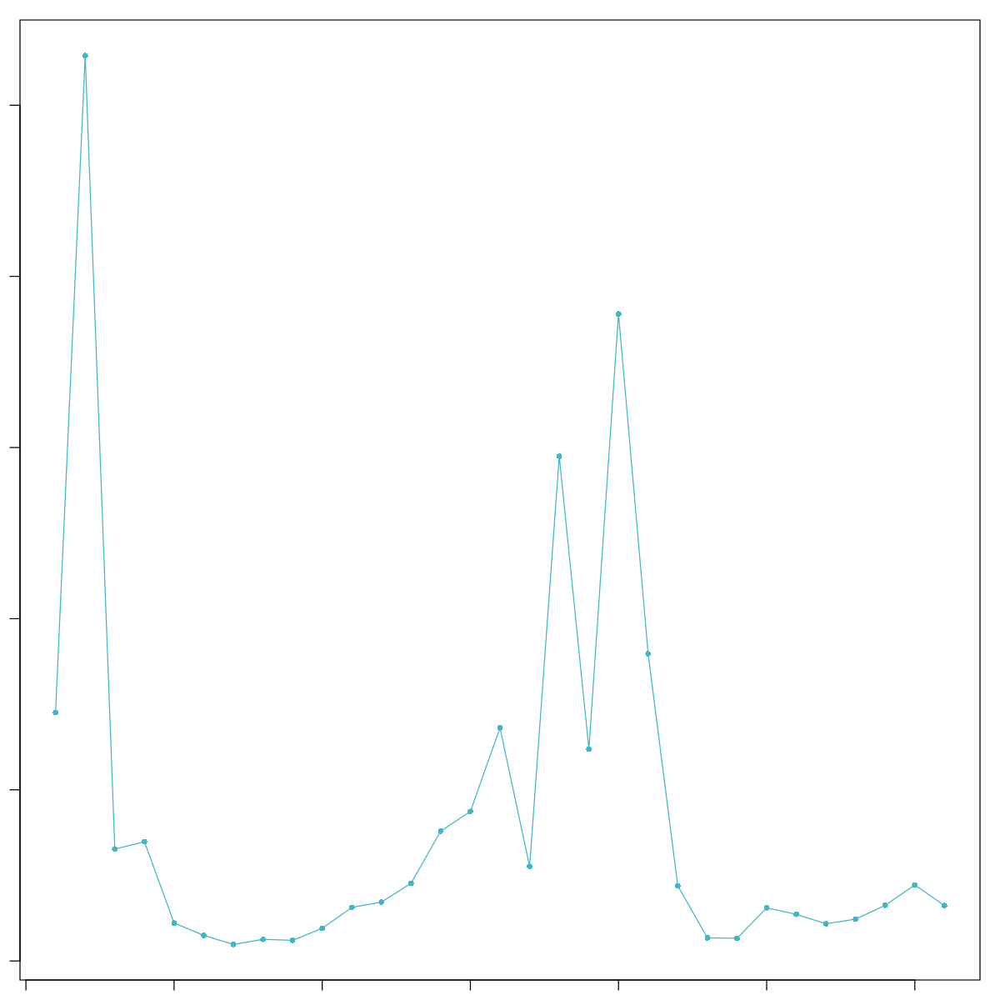

[1] "Calculating PC distance matrix..."
[1] "Defining neighborhoods..."
[1] "Computing pANN across all pK..."
[1] "pK = 0.005..."
[1] "pK = 0.01..."
[1] "pK = 0.02..."
[1] "pK = 0.03..."
[1] "pK = 0.04..."
[1] "pK = 0.05..."
[1] "pK = 0.06..."
[1] "pK = 0.07..."
[1] "pK = 0.08..."
[1] "pK = 0.09..."
[1] "pK = 0.1..."
[1] "pK = 0.11..."
[1] "pK = 0.12..."
[1] "pK = 0.13..."
[1] "pK = 0.14..."
[1] "pK = 0.15..."
[1] "pK = 0.16..."
[1] "pK = 0.17..."
[1] "pK = 0.18..."
[1] "pK = 0.19..."
[1] "pK = 0.2..."
[1] "pK = 0.21..."
[1] "pK = 0.22..."
[1] "pK = 0.23..."
[1] "pK = 0.24..."
[1] "pK = 0.25..."
[1] "pK = 0.26..."
[1] "pK = 0.27..."
[1] "pK = 0.28..."
[1] "pK = 0.29..."
[1] "pK = 0.3..."
NULL
[1] "Creating 1900 artificial doublets..."
[1] "Creating Seurat object..."
[1] "Running SCTransform..."


Running SCTransform on assay: RNA

Running SCTransform on layer: counts

vst.flavor='v2' set. Using model with fixed slope and excluding poisson genes.

Variance stabilizing transformation of count matrix of size 19061 by 7600

Model formula is y ~ log_umi

Get Negative Binomial regression parameters per gene

Using 2000 genes, 5000 cells

Found 32 outliers - those will be ignored in fitting/regularization step


Second step: Get residuals using fitted parameters for 19061 genes

Computing corrected count matrix for 19061 genes

Calculating gene attributes

Wall clock passed: Time difference of 56.98517 secs

Determine variable features

Centering data matrix

Getting residuals for block 1(of 2) for counts dataset

Getting residuals for block 2(of 2) for counts dataset

Centering data matrix

Finished calculating residuals for counts

Set default assay to SCT



[1] "Running PCA..."


PC_ 1 
Positive:  CFD, DCN, APOD, SFRP2, IGFBP6, GSN, FBLN1, PLA2G2A, SLPI, SFRP4 
	   MFAP5, IGFBP5, MGP, CCDC80, SERPINF1, C1R, PI16, TIMP3, LUM, C1S 
	   WISP2, ACKR3, C3, MFAP4, ADH1B, FBLN2, COL1A2, PCOLCE2, IGFBP7, FBN1 
Negative:  CCL4, S100A9, LYZ, HLA-DRA, S100A8, CCL4L2, CCL3, AREG, C1QB, C1QA 
	   CD74, HLA-DRB1, HLA-DPA1, CCL5, HLA-DPB1, TYROBP, C1QC, CXCL8, HLA-DQA1, AIF1 
	   FCER1G, GNLY, FCN1, IL1B, NKG7, TPSAB1, SRGN, CTSS, RNASE1, CD14 
PC_ 2 
Positive:  S100A9, S100A8, LYZ, CFD, CCL3, HLA-DRA, C1QB, C1QA, CCL4L2, CCL4 
	   CXCL8, FTL, C1QC, AREG, HLA-DRB1, TYROBP, HLA-DPA1, FCN1, AIF1, CD74 
	   DCN, IL1B, CD14, HLA-DPB1, FCER1G, CTSS, APOD, CCL3L1, HLA-DQA1, FTH1 
Negative:  TAGLN, ACTA2, MYL9, TPM2, MGP, C11orf96, CALD1, MYH11, RGS5, IGFBP7 
	   SPARCL1, DSTN, TPM1, PPP1R14A, ADIRF, BGN, PLN, VIM, CTGF, LMOD1 
	   FHL1, FN1, MYH10, MAP1B, ITGA8, IGFBP2, C12orf75, COL14A1, CSRP1, FRZB 
PC_ 3 
Positive:  S100A9, S100A8, TAGLN, ACTA2, LYZ, MYL9, TPM2, MGP, C11orf96, A

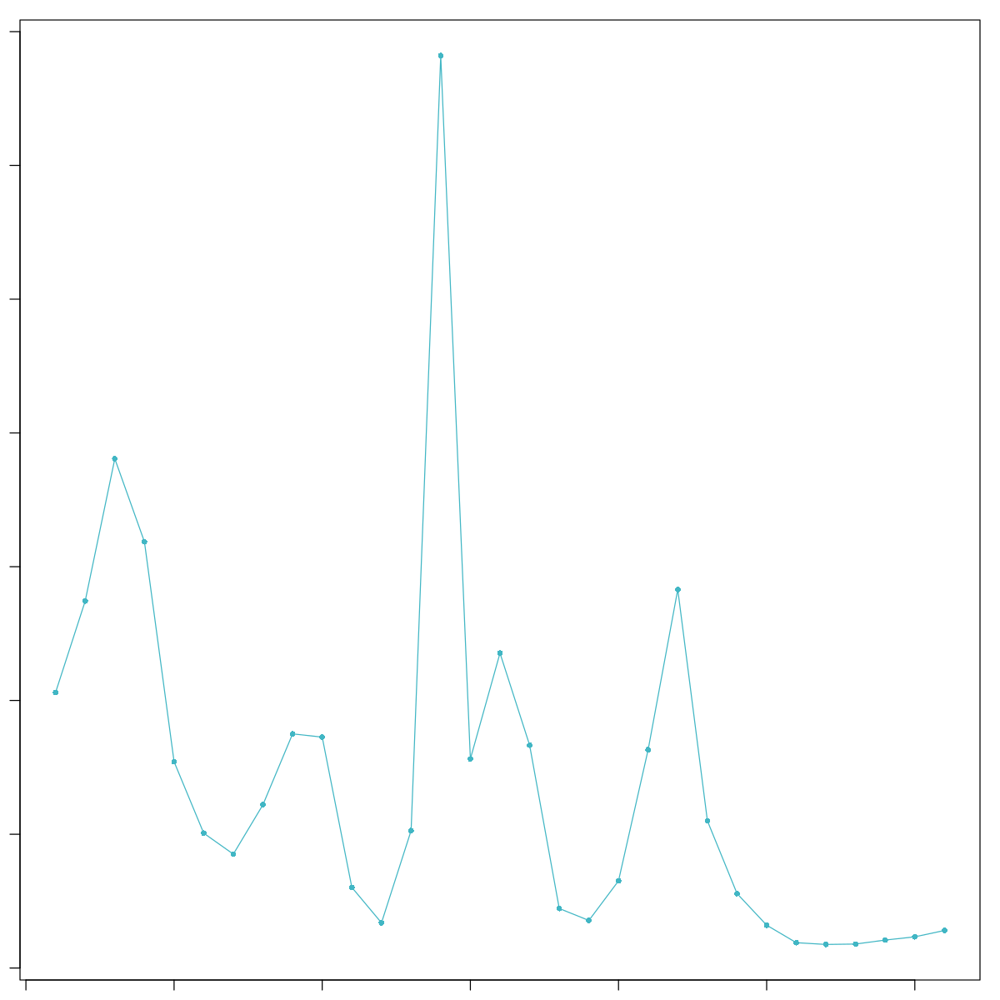

[1] "Calculating PC distance matrix..."
[1] "Computing pANN..."
[1] "Classifying doublets.."


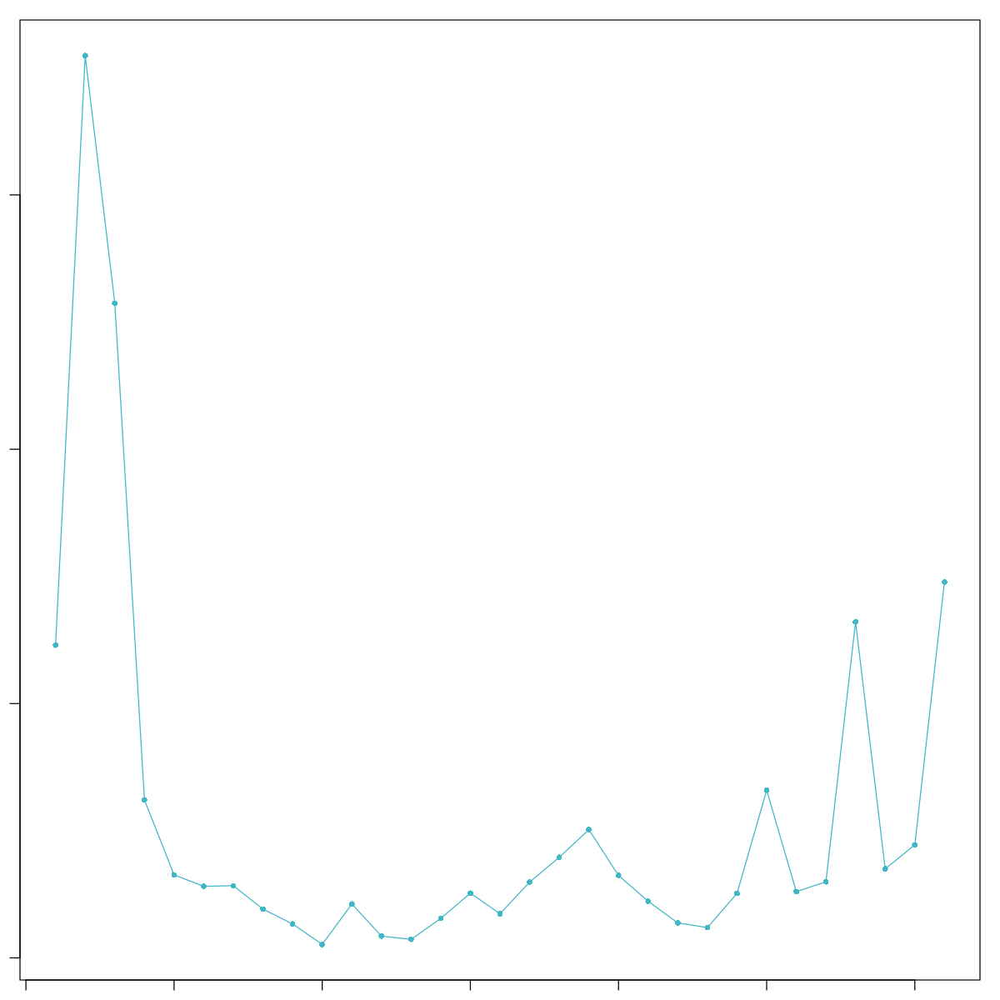

In [165]:
# Doublet removal

# loop through samples to find doublets
for (i in 1:length(mouse.split)) {
  # print the sample we are on
  print(paste0("Sample ",i))

  mouse.sample <- mouse.split[[i]]
  
  # pK identification (no ground-truth)
  sweep.list <- paramSweep(mouse.sample, PCs = 1:10, sct = TRUE)
  sweep.stats <- summarizeSweep(sweep.list, GT = FALSE)
  bcmvn <- find.pK(sweep.stats)
  
  # Optimal pK is the max of the bomodality coefficent (BCmvn) distribution
  bcmvn.max <- bcmvn[which.max(bcmvn$BCmetric),]
  optimal.pk <- bcmvn.max$pK
  optimal.pk <- as.numeric(levels(optimal.pk))[optimal.pk]
  
  ## Homotypic doublet proportion estimate
  annotations <- mouse.sample@meta.data$seurat_clusters
  homotypic.prop <- modelHomotypic(annotations) 
  nExp.poi <- round(optimal.pk * nrow(mouse.sample@meta.data)) ## Assuming 7.5% doublet formation rate - tailor for your dataset
  nExp.poi.adj <- round(nExp.poi * (1 - homotypic.prop))
  
  # run DoubletFinder
  mouse.sample <- doubletFinder(seu = mouse.sample, 
                                   PCs = 1:10, 
                                   pK = optimal.pk,
                                   nExp = nExp.poi.adj,
                                   sct=TRUE)
  #metadata <- mouse.sample@meta.data
  #colnames(metadata)[15] <- "doublet_finder"
  #mouse.sample@meta.data <- metadata 
  
  # subset and save
  #mouse.singlets <- subset(mouse.sample, doublet_finder == "Singlet")
  #mouse.split[[i]] <- mouse.singlets
  #remove(mouse.singlets)
  mouse.split[[i]] <- mouse.sample
}

In [167]:
howe.singlets_p <- merge(x = mouse.split[[1]],
                       y = c(mouse.split[[2]], mouse.split[[3]]),
                       project = "Vascular scRNAseq")
howe.singlets_p

An object of class Seurat 
41645 features across 17100 samples within 2 assays 
Active assay: SCT (18067 features, 0 variable features)
 3 layers present: counts, data, scale.data
 1 other assay present: RNA

In [184]:
howe

An object of class Seurat 
41645 features across 17100 samples within 2 assays 
Active assay: SCT (18067 features, 3000 variable features)
 3 layers present: counts, data, scale.data
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, harmony, umap

In [168]:
colnames(howe.singlets_p@meta.data)

[1] "orig.ident"                       "nCount_RNA"                      
 [3] "nFeature_RNA"                     "percent.mt"                      
 [5] "sample"                           "patient"                         
 [7] "condition"                        "nCount_SCT"                      
 [9] "nFeature_SCT"                     "SCT_snn_res.0.5"                 
[11] "seurat_clusters"                  "cell_type"                       
[13] "pANN_0.25_0.01_51"                "DF.classifications_0.25_0.01_51" 
[15] "pANN_0.25_0.13_654"               "DF.classifications_0.25_0.13_654"
[17] "pANN_0.25_0.01_52"                "DF.classifications_0.25_0.01_52"

In [169]:
saveRDS(howe.singlets_p, file = "/cluster/home/t915857uhn/Howe_Analysis/seurat_object_doublet_2.rds")

### Doublet Filtering

In [20]:
# Load object

# howe.singlets <- readRDS(file = "/cluster/home/t915857uhn/Howe_Analysis/seurat_object_doublet.rds")
# original doubletfinder run, split by sample. 

# Represents doubletfinder run, split by patient (correct one)
howe.singlets <- readRDS(file = "/cluster/home/t915857uhn/Howe_Analysis/seurat_object_doublet_2.rds")

In [21]:
colnames(howe.singlets@meta.data)

[1] "orig.ident"                       "nCount_RNA"                      
 [3] "nFeature_RNA"                     "percent.mt"                      
 [5] "sample"                           "patient"                         
 [7] "condition"                        "nCount_SCT"                      
 [9] "nFeature_SCT"                     "SCT_snn_res.0.5"                 
[11] "seurat_clusters"                  "cell_type"                       
[13] "pANN_0.25_0.01_51"                "DF.classifications_0.25_0.01_51" 
[15] "pANN_0.25_0.13_654"               "DF.classifications_0.25_0.13_654"
[17] "pANN_0.25_0.01_52"                "DF.classifications_0.25_0.01_52"

In [22]:
howe.singlets@meta.data <- howe.singlets@meta.data %>%
  mutate(doublet = coalesce(DF.classifications_0.25_0.01_51, 
                               DF.classifications_0.25_0.13_654, 
                               DF.classifications_0.25_0.01_52))

In [23]:
head(howe.singlets@meta.data,n=2)
unique(howe.singlets@meta.data$doublet)

,orig.ident,nCount_RNA,nFeature_RNA,percent.mt,sample,patient,condition,nCount_SCT,nFeature_SCT,SCT_snn_res.0.5,seurat_clusters,cell_type,pANN_0.25_0.01_51,DF.classifications_0.25_0.01_51,pANN_0.25_0.13_654,DF.classifications_0.25_0.13_654,pANN_0.25_0.01_52,DF.classifications_0.25_0.01_52,doublet
,<chr>,<dbl>,<int>,<dbl>,<chr>,<chr>,<chr>,<dbl>,<int>,<chr>,<chr>,<chr>,<dbl>,<chr>,<dbl>,<chr>,<dbl>,<chr>,<chr>
AAACGAAAGATCCCAT-1,howe,7783,2325,3.880252,patient_1_PA,patient_1,PA,5423,2284,1,1,EC_1,0.09210526,Singlet,NA,NA,NA,NA,Singlet
AAACGAACAGGCTACC-1,howe,4723,1645,3.175947,patient_1_PA,patient_1,PA,4749,1631,2,2,VSMC_1,0.06578947,Singlet,NA,NA,NA,NA,Singlet


[1] "Singlet" "Doublet"

In [24]:
doublet_df <- data.frame(
  barcode = rownames(howe.singlets@meta.data),
  doublet = howe.singlets@meta.data$doublet)

howe@meta.data <- merge(howe@meta.data, doublet_df, by.x = 0, by.y = 'barcode')
rownames(howe@meta.data) <- howe@meta.data$Row.names
howe@meta.data$Row.names <- NULL
head(howe@meta.data,n=2)

,orig.ident,nCount_RNA,nFeature_RNA,percent.mt,sample,patient,condition,nCount_SCT,nFeature_SCT,SCT_snn_res.0.5,seurat_clusters,cell_type,doublet
,<chr>,<dbl>,<int>,<dbl>,<chr>,<chr>,<chr>,<dbl>,<int>,<fct>,<fct>,<fct>,<chr>
AAACCCAAGCGCATCC-6,howe,6070,2172,4.135091,patient_3_AC,patient_3,AC,5017,2141,16,16,VSMC_3,Singlet
AAACCCAAGGGTTTCT-2,howe,7083,2198,1.694197,patient_1_AC,patient_1,AC,5103,2178,4,4,Macrophage_1,Singlet


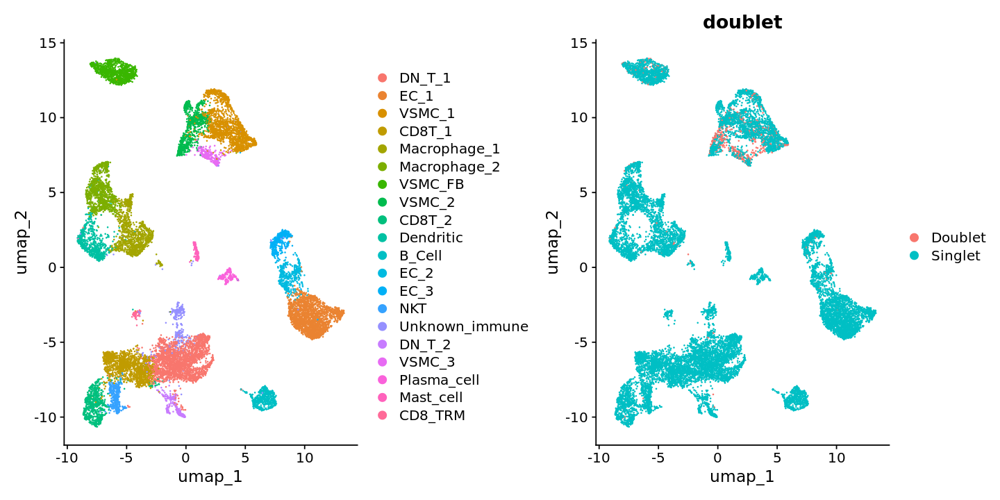

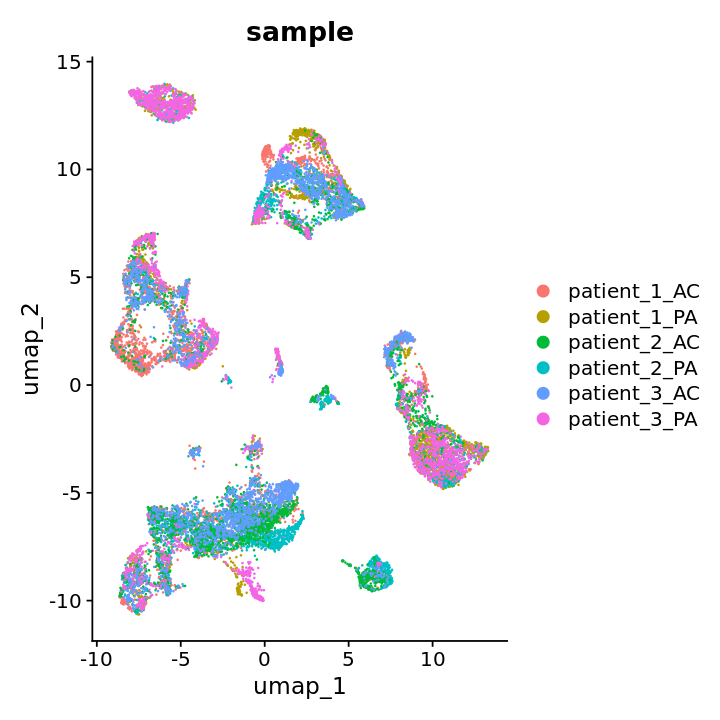

In [25]:
options(repr.plot.width=12, repr.plot.height=6)
DimPlot(howe) + DimPlot(howe, group.by = 'doublet')

options(repr.plot.width=6, repr.plot.height=6)
DimPlot(howe, group.by = 'sample')

### Proteomics data SSGEA (AddModule)

In [29]:
df_all <- read.csv('CarotidEV_70VVGroup_PerseusExport_MedianNorm_Log2_NormImp_Qlucore_08092023_ForSneha.csv')
df_all <- as.data.frame(t(df_all[-2]))

df_all[1, 'V1'] <- df_all[2, 'V1']  # For 'Symp'
df_all[1, 'V2'] <- df_all[2, 'V2']  # For 'Symp'
df_all[1, 'V3'] <- df_all[2, 'V3']  # For 'Tissue'
df_all[1, 'V4'] <- df_all[2, 'V4']  # For 'State'

colnames(df_all) <- as.character(df_all[1, ])
head(df_all,n=4)

,Symp,Tissue,State,Donor,T: GeneID,ZMPSTE24,YWHAZ,YWHAQ,YWHAH,YWHAG,⋯,ACE,ACAN,ABI3BP,ABI1,ABHD14B,ABHD12,ABCC1,A4GALT,A2M,A1BG
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
X,Symp,Tissue,State,Donor,T: GeneID,ZMPSTE24,YWHAZ,YWHAQ,YWHAH,YWHAG,⋯,ACE,ACAN,ABI3BP,ABI1,ABHD14B,ABHD12,ABCC1,A4GALT,A2M,A1BG
Sample.ID,Symp,Tissue,State,Donor,N: Score Sequest HT: Sequest HT,153.28,1293.01,833.58,824.79,1012.73,⋯,75.2,676.37,70.78,16.47,7.3,62.66,232.21,14.13,8192.56,650.69
X4982_H,S,H,S_H,4982,4982_H,2.50239,5.22019,0.838331,3.89499,2.53437,⋯,-1.50368,4.10848,-2.35927,-0.989353,-5.0106,-3.2825,0.892282,-4.01448,5.56348,2.36304
X4982_NC,S,NC,S_NC,4982,4982_NC,1.5527,3.69039,0.321216,3.0927,2.0165,⋯,0.573973,0.788261,-3.33047,-2.15463,-3.68434,-0.968509,-0.524492,-4.23332,5.80519,2.11613


In [30]:
df_t <- t(df_all[1,])
df_t <- as.data.frame(df_t)
df_t$genes <- rownames(df_t)
df_t <- df_t[-c(1,2,3,4,5), ]
gene_list <- df_t$genes


formatted_genes <- paste0("", gene_list, "")
all_genes <- c(formatted_genes)

In [42]:
df <- read.csv('test.csv')

top_25 <- ceiling(nrow(df) * 0.25)
top_25_df <- df[1:top_25, ]

# Extract gene names into a list
top_25_genes <- top_25_df$T..GeneID
top_25_genes <- c(top_25_genes)

In [32]:
howe <- AddModuleScore(object = howe,
               features = list(all_genes),
               name = 'all_prot_features', search=TRUE)

Warning message:
“The following features are not present in the object: WARS1, UQCRFS1P1, TUBB3, TTR, TMT1A, SPTA1, SPP2, SLC4A1, SERPINC1, SERPINA6, SERPINA4, SERPINA10, SERPINA1.1, SEPTIN9, SEPTIN8, SEPTIN7, SEPTIN6, SEPTIN2, SEPTIN11, SEPTIN10, SAA2.SAA4, RHD, RAB6C, PRXL2A, PON1, POGLUT3, PLG, PKM.1, PHB1, PGK2, PDIA3.1, ORM2, OCC1, NME1.NME2, NIBAN2, NIBAN1, NHERF2, NCF1B, MT.CO2, MTARC2, MST1L, MASP2, MACROH2A1, LPP.1, LPA, KRT9, KRT85, KRT84, KRT74, KRT6A, KRT5, KRT2, KRT13, KNG1, KLKB1, ITIH2, ITIH1, ITGA2B, ITGA2.1, IGLV8.61, IGLV3.10, IGLV1.36, IGKV4.1, IGKV3.20, IGKV2.40, IGKV2.30, IGHV6.1, IGHV5.10.1, IGHV4.34, IGHV3.74, IGHV3.72, IGHV3.7, IGHV3.49, IGHV3.15, IGHV2.70D, IGHV1.18, IGFALS, HSPA7, HRG, HPX, HLA.F, HLA.E, HLA.DRB5, HLA.DRB3, HLA.DRB1, HLA.DRB1.1, HLA.DRA, HLA.DQB1, HLA.DQB1.1, HLA.DQA1, HLA.DQA1.1, HLA.DQA1.2, HLA.DPB1, HLA.DPB1.1, HLA.DPB1.2, HLA.DPA1, HLA.C, HLA.C.1, HLA.B, HLA.B.1, HLA.A, HLA.A.1, HBG1, HBD, HBA1, H4C1, H3.7, H3.3A, H2BC21, H2BC18, H2AZ2, H2

In [33]:
howe <- AddModuleScore(object = howe,
               features = list(top_25_genes),
               name = 'top_25_prot', search=TRUE)

Warning message:
“The following features are not present in the object: ALB, HBA1, APOA4, C4A, FGB, FGG, HBD, C9, SLC4A1, FGA, APCS, ACTBL2, H4C1, KRT9, NIBAN1, ITIH2, PON1, AMBP, KRT2, ITGA2B, TUBB3, ITIH1, H2AC20, CA1, F2, TTR, H2BC18, SERPINC1, C8A, C4BPA, PLG, H2BC21, HLA-DRB3, ADIPOQ, HRG, HPX, PHB1, CPB2, AHSG, HBG1, C8B, attempting to find updated synonyms”
Warning message:
“Could not reach HGNC's gene names database”
Warning message:
“The following features are still not present in the object: ALB, HBA1, APOA4, C4A, FGB, FGG, HBD, C9, SLC4A1, FGA, APCS, ACTBL2, H4C1, KRT9, NIBAN1, ITIH2, PON1, AMBP, KRT2, ITGA2B, TUBB3, ITIH1, H2AC20, CA1, F2, TTR, H2BC18, SERPINC1, C8A, C4BPA, PLG, H2BC21, HLA-DRB3, ADIPOQ, HRG, HPX, PHB1, CPB2, AHSG, HBG1, C8B”


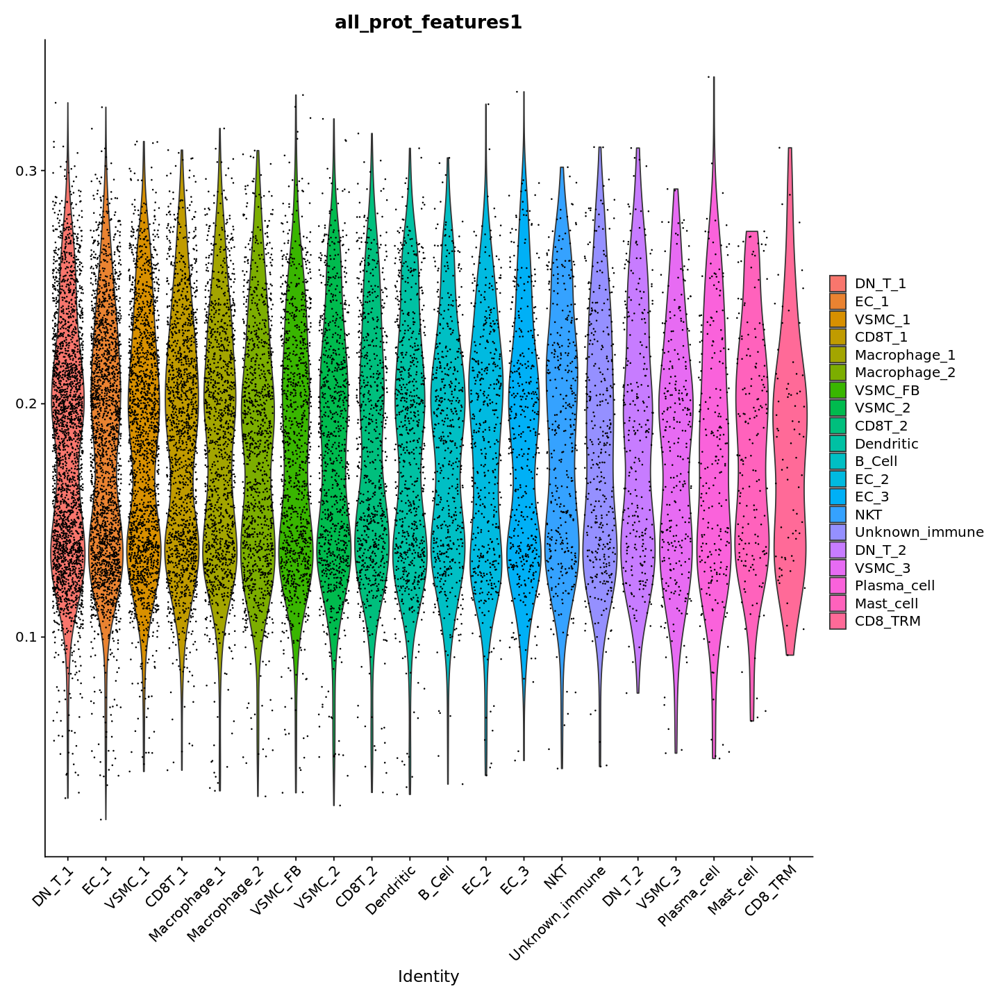

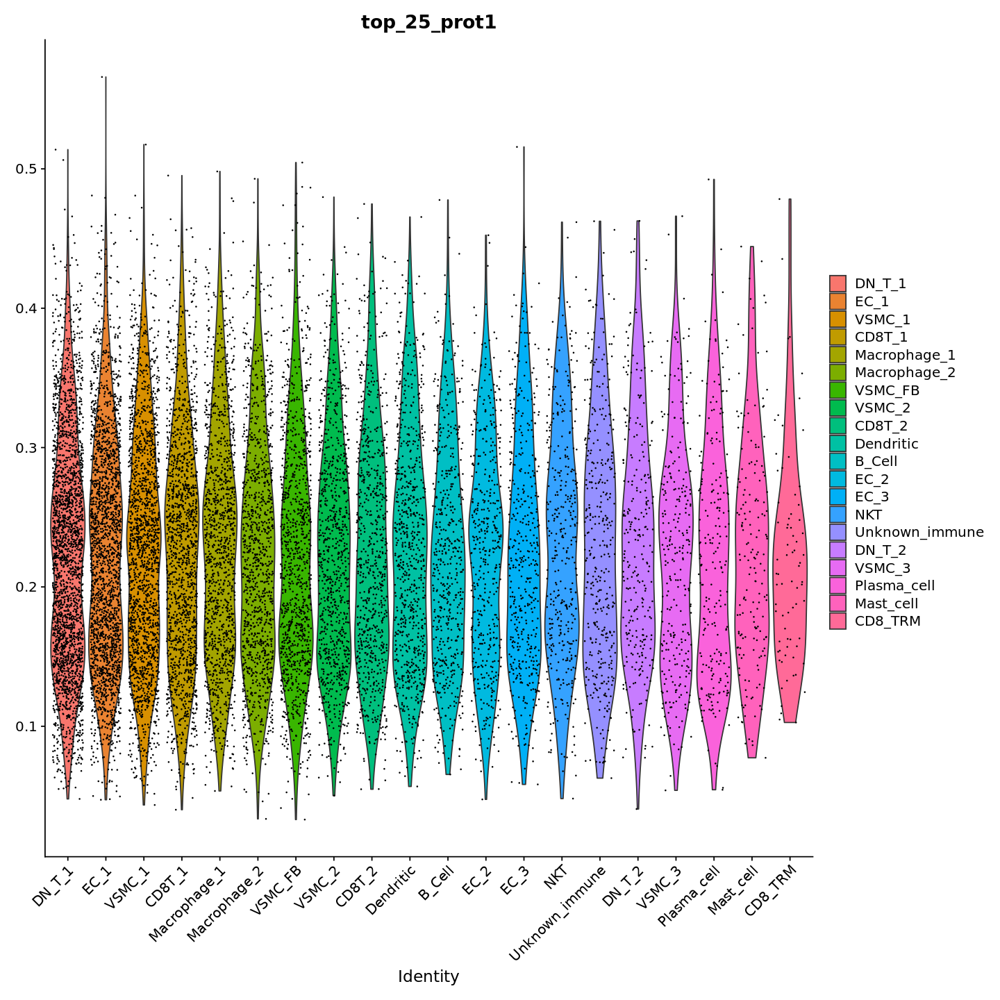

In [48]:
options(repr.plot.width=12, repr.plot.height=12)

VlnPlot(howe, group.by='cell_type',features="all_prot_features1")
VlnPlot(howe, group.by='cell_type',features="top_25_prot1")

### CellChat Analysis

In [16]:
library(CellChat)
library(reshape2)
library(patchwork)
options(stringsAsFactors = FALSE)


CellChatDB <- CellChatDB.human
CellChatDB.use <- CellChatDB

Loading required package: igraph


Attaching package: ‘igraph’


The following object is masked from ‘package:tidyr’:

    crossing


The following objects are masked from ‘package:dplyr’:

    as_data_frame, groups, union


The following object is masked from ‘package:Seurat’:

    components


The following objects are masked from ‘package:stats’:

    decompose, spectrum


The following object is masked from ‘package:base’:

    union



Attaching package: ‘reshape2’


The following object is masked from ‘package:tidyr’:

    smiths




In [28]:
cc_full <- createCellChat(object = howe, group.by = "ident", assay = "SCT")
cc_full@DB <- CellChatDB.use

[1] "Create a CellChat object from a Seurat object"
The `meta.data` slot in the Seurat object is used as cell meta information 
The cell barcodes in 'meta' is  AAACCCAAGCGCATCC-6 AAACCCAAGGGTTTCT-2 AAACCCAAGGTAGACC-3 AAACCCAAGTGGCCTC-6 AAACCCACATTACGGT-4 AAACCCACATTCTCCG-2 


Warning message in createCellChat(object = howe, group.by = "ident", assay = "SCT"):
“The cell barcodes in 'meta' is different from those in the used data matrix.
              We now simply assign the colnames in the data matrix to the rownames of 'mata'!”


Set cell identities for the new CellChat object 
The cell groups used for CellChat analysis are  DN_T_1, EC_1, VSMC_1, CD8T_1, Macrophage_1, Macrophage_2, VSMC_FB, VSMC_2, CD8T_2, Dendritic, B_Cell, EC_2, EC_3, NKT, Unknown_immune, DN_T_2, VSMC_3, Plasma_cell, Mast_cell, CD8_TRM 


In [29]:
cellchat <- subsetData(cc_full)
cellchat <- identifyOverExpressedGenes(cellchat)
cellchat <- identifyOverExpressedInteractions(cellchat)

In [30]:
cellchat <- computeCommunProb(cellchat, type = "triMean")
cellchat <- filterCommunication(cellchat, min.cells = 10)
cellchat <- computeCommunProbPathway(cellchat)
cellchat <- aggregateNet(cellchat)
cellchat <- netAnalysis_computeCentrality(cellchat, slot.name = "netP")

triMean is used for calculating the average gene expression per cell group. 
[1] ">>> Run CellChat on sc/snRNA-seq data <<< [2024-01-18 21:24:42.028877]"
[1] ">>> CellChat inference is done. Parameter values are stored in `object@options$parameter` <<< [2024-01-18 21:33:35.838566]"


In [17]:
# Load CellChat Object

cellchat <- readRDS(file = "/cluster/home/t915857uhn/Howe_Analysis/cellchat_obj.rds")

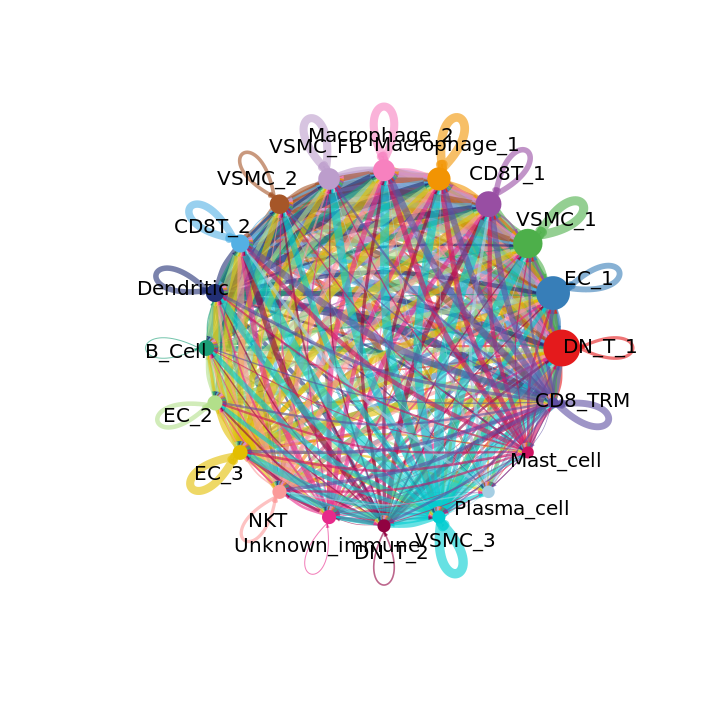

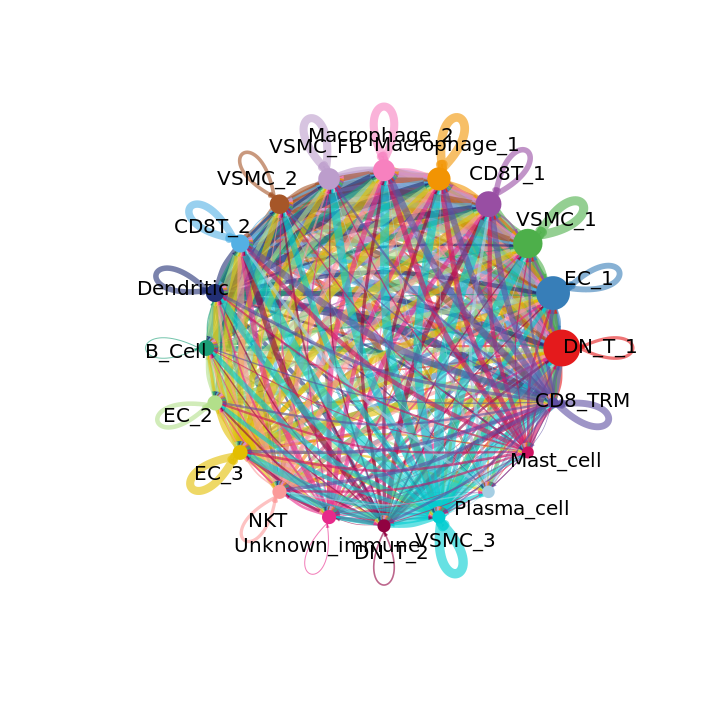

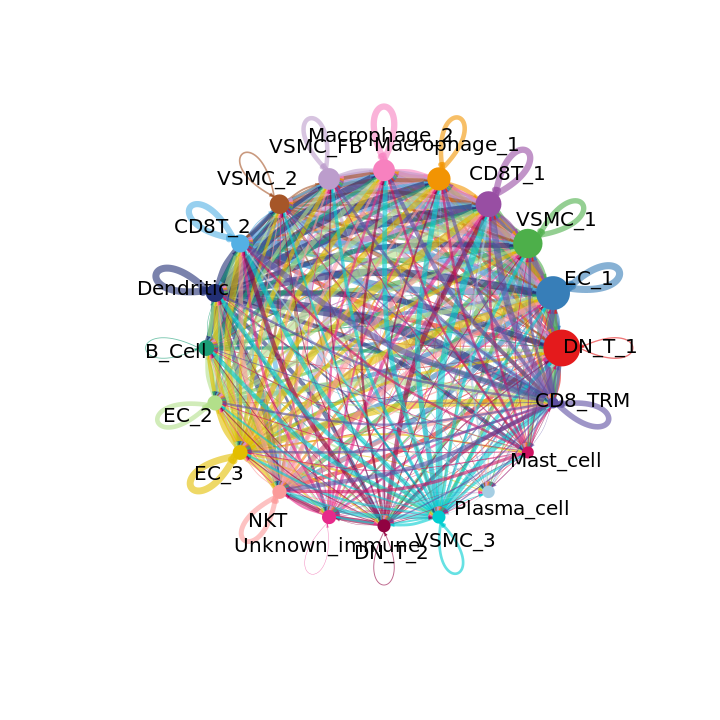

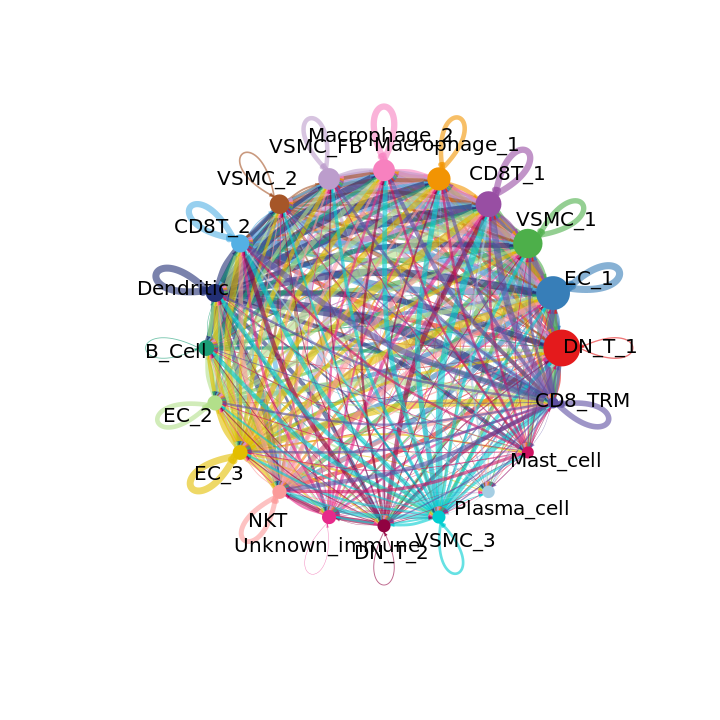

In [32]:
# Aggregated cell-cell communication network
groupSize <- as.numeric(table(cellchat@idents))

options(repr.plot.width=6, repr.plot.height=6)

netVisual_circle(cellchat@net$count, vertex.weight = groupSize, 
                 weight.scale = T, label.edge= F, title.name = "Number of interactions")
netVisual_circle(cellchat@net$weight, vertex.weight = groupSize, 
                 weight.scale = T, label.edge= F, title.name = "Interaction weights/strength")

No id variables; using all as measure variables



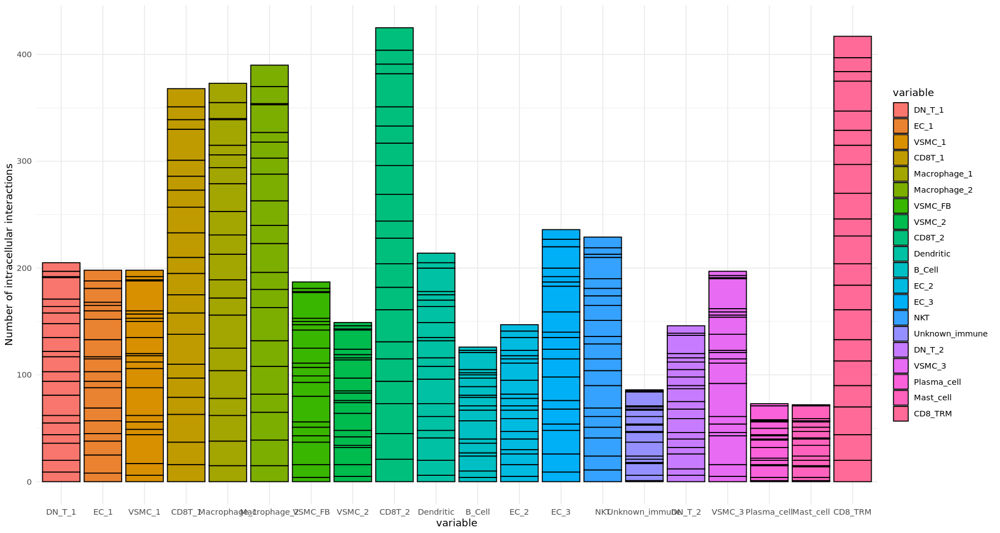

In [33]:
# Visualize number of intracellular interactions

count_interactions <- as.data.frame(cellchat@net[["count"]])
count_interactions <- melt(count_interactions)
# Subset data to show only certain cell types
# count_interactions <- subset(count_interactions, variable == c('EC_1','EC_2'))

options(repr.plot.width=15, repr.plot.height=8)

gg1 <- ggplot(count_interactions, aes(x=variable, y=value, fill=variable))+
  geom_bar(stat="identity", color="black")+
  labs(y = "Number of intracellular interactions") +
  theme_minimal()
gg1

No id variables; using all as measure variables



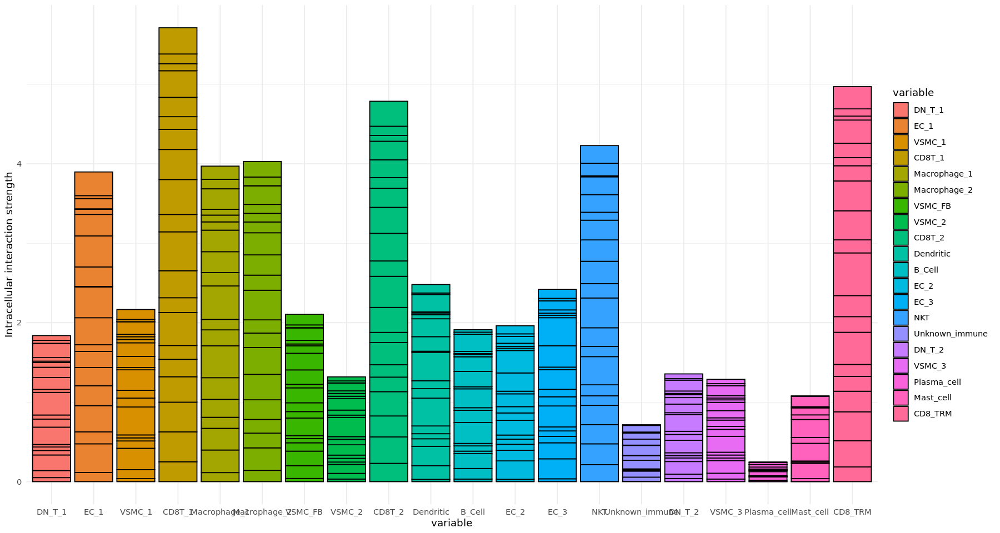

In [34]:
#intercellular interaction strength (probability interactions took place)

weight <- as.data.frame(cellchat@net[["weight"]])
weight_interactions <- melt(weight)
# Subset data to show only certain cell types
# weight_interactions <- subset(weight_interactions, variable == c('EC_1','EC_2'))

options(repr.plot.width=15, repr.plot.height=8)

gg2 <- ggplot(weight_interactions, aes(x=variable, y=value, fill=variable))+
  geom_bar(stat="identity", color="black")+
  labs(y = "Intracellular interaction strength") + 
  theme_minimal()

gg2

In [35]:
levels(cellchat@idents)

[1] "DN_T_1"         "EC_1"           "VSMC_1"         "CD8T_1"        
 [5] "Macrophage_1"   "Macrophage_2"   "VSMC_FB"        "VSMC_2"        
 [9] "CD8T_2"         "Dendritic"      "B_Cell"         "EC_2"          
[13] "EC_3"           "NKT"            "Unknown_immune" "DN_T_2"        
[17] "VSMC_3"         "Plasma_cell"    "Mast_cell"      "CD8_TRM"

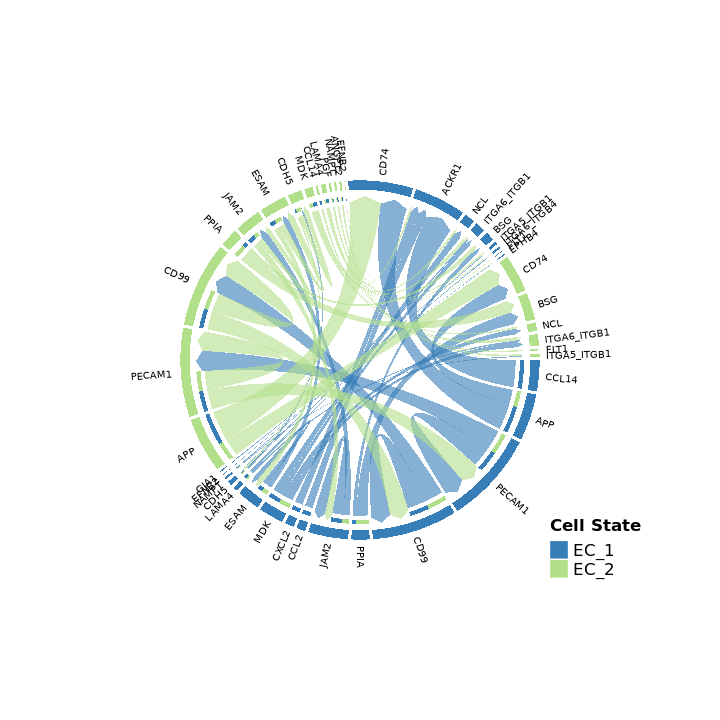

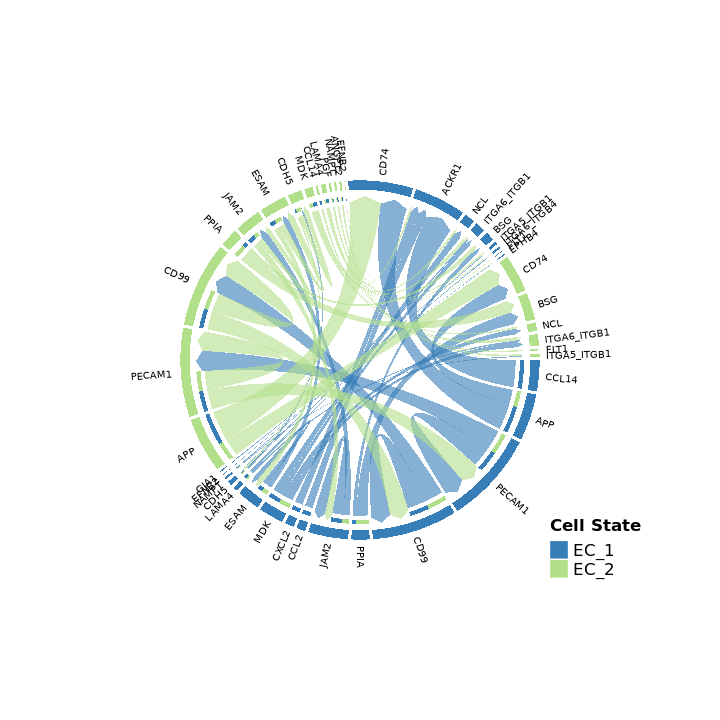

In [20]:
options(repr.plot.width=6, repr.plot.height=6)
netVisual_chord_gene(cellchat, sources.use = c("EC_1","EC_2"),
                     targets.use = c("EC_1","EC_2"), lab.cex = 0.5,legend.pos.y = 30)

In [21]:
#subset for only top ligand recceptor pairs 
object <- cellchat
prob <- slot(object, "net")$prob
pval <- slot(object, "net")$pval
prob[pval > 0.05] <- 0
net <- reshape2::melt(prob, value.name = "prob")
colnames(net)[1:3] <- c("source", "target", "interaction_name")
pairLR = dplyr::select(object@LR$LRsig, c("interaction_name_2", 
                                          "pathway_name", "ligand", "receptor", "annotation", 
                                          "evidence"))
idx <- match(net$interaction_name, rownames(pairLR))
temp <- pairLR[idx, ]
net <- cbind(net, temp)

net <- net[net$prob > 1.0e-02,]

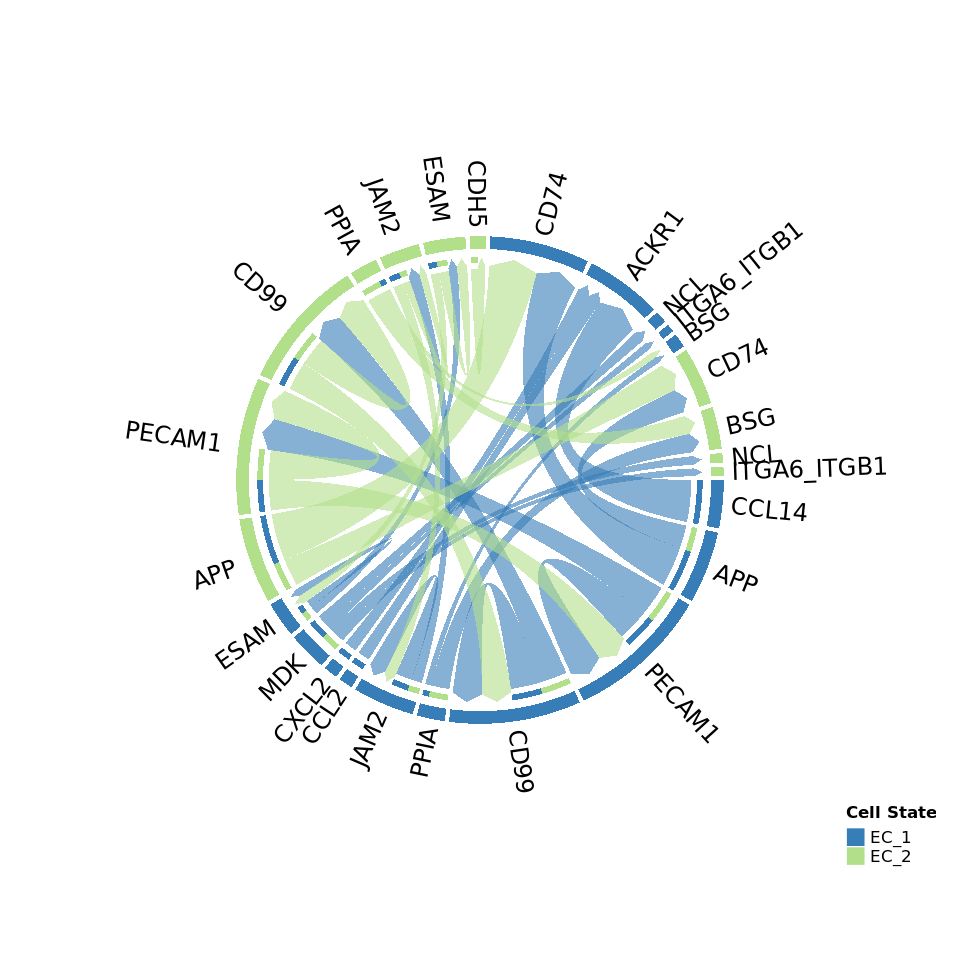

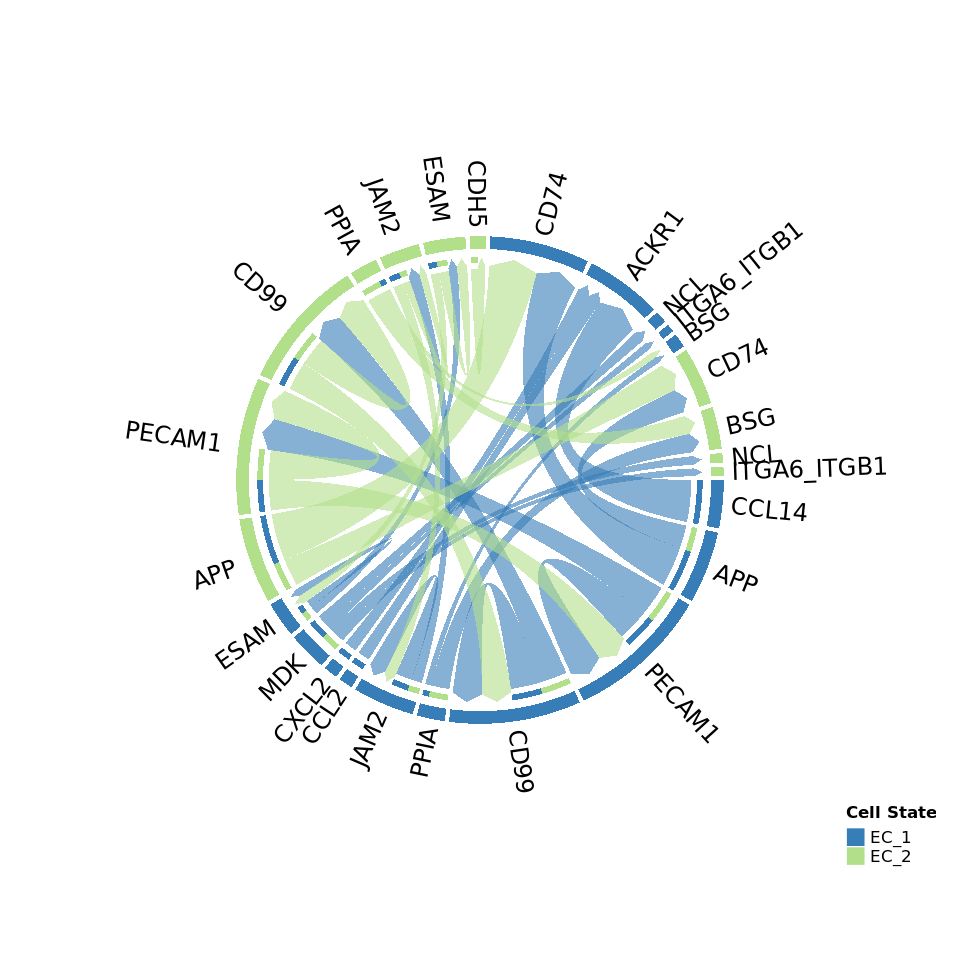

In [23]:
options(repr.plot.width=8, repr.plot.height=8)

# Cell signalling between EC cells with a stringent cutoff (interaction_prob<0.001)
netVisual_chord_gene(object, net = net, sources.use = c('EC_1','EC_2'), 
                     targets.use = c('EC_1','EC_2'),legend.pos.x = 8,
                     thresh = 0.001,lab.cex = 1.2)

In [ ]:
# extract signaling info - NOT DONE
object <- cellchat
prob <- slot(object, "net")$prob
pval <- slot(object, "net")$pval
prob[pval > 0.05] <- 0
net <- reshape2::melt(prob, value.name = "prob")
colnames(net)[1:3] <- c("source", "target", "interaction_name")
pairLR = dplyr::select(object@LR$LRsig, c("interaction_name_2", 
                                          "pathway_name", "ligand", "receptor", "annotation", 
                                          "evidence"))
idx <- match(net$interaction_name, rownames(pairLR))
temp <- pairLR[idx, ]
net <- cbind(net, temp)

write.csv(net, file ="cellchat_signaling.csv")

In [40]:
# Load cell chat object into my R and run
ht1 <- netAnalysis_signalingRole_heatmap(cellchat, pattern = "outgoing")
ht2 <- netAnalysis_signalingRole_heatmap(cellchat, pattern = "incoming")


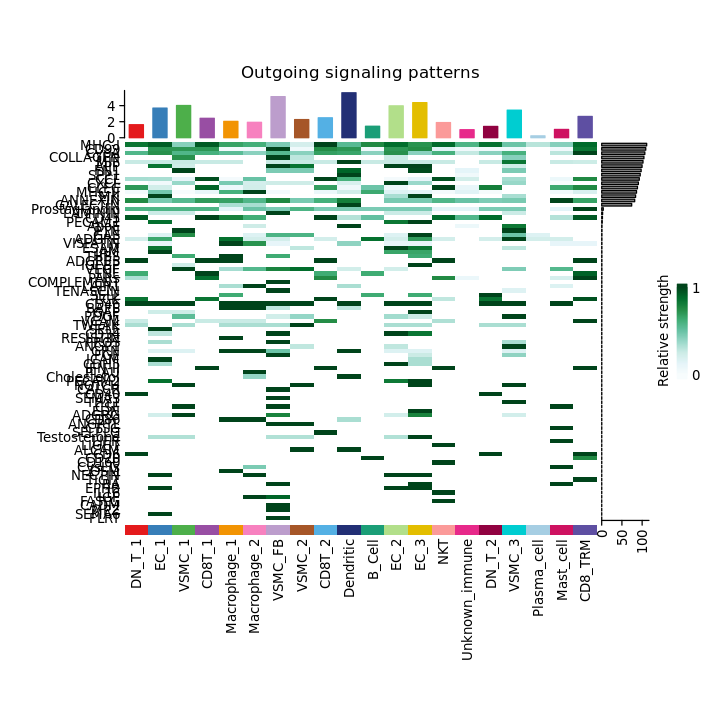

In [41]:
ht1

#### Testing subsetting

In [52]:
# Function to subset for specific ligand/receptor interactions

contains_any_gene <- function(string, genes) {
  any(sapply(genes, function(gene) str_detect(string, fixed(gene))))
}

# Apply this function to each row of the dataframe and create a logical vector
matches <- apply(net2, 1, function(row) {
  contains_any_gene(row["ligand"], top_25_genes) && contains_any_gene(row["receptor"], top_25_genes)
})

# Subset the dataframe
subset_net2 <- net2[matches, ]

## Do we want AND or OR case for choosing ligand/receptor interactions

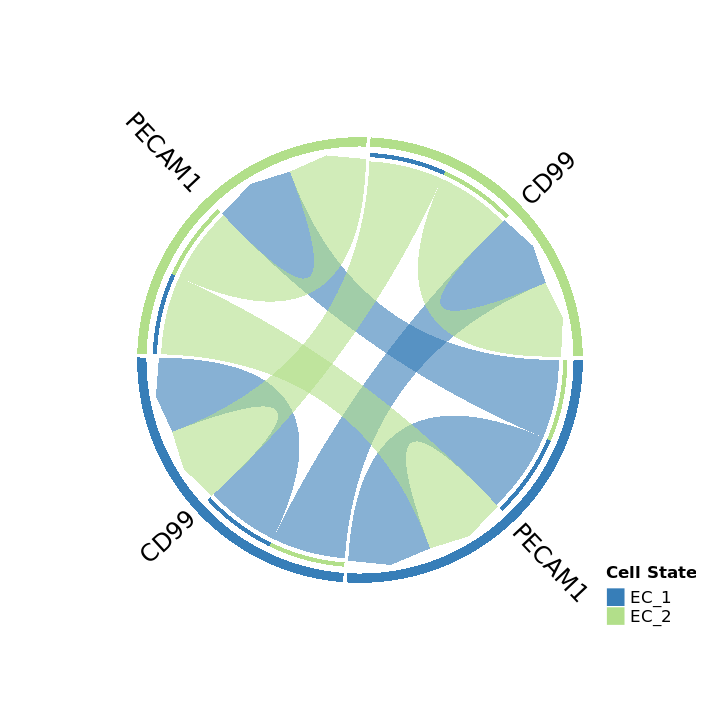

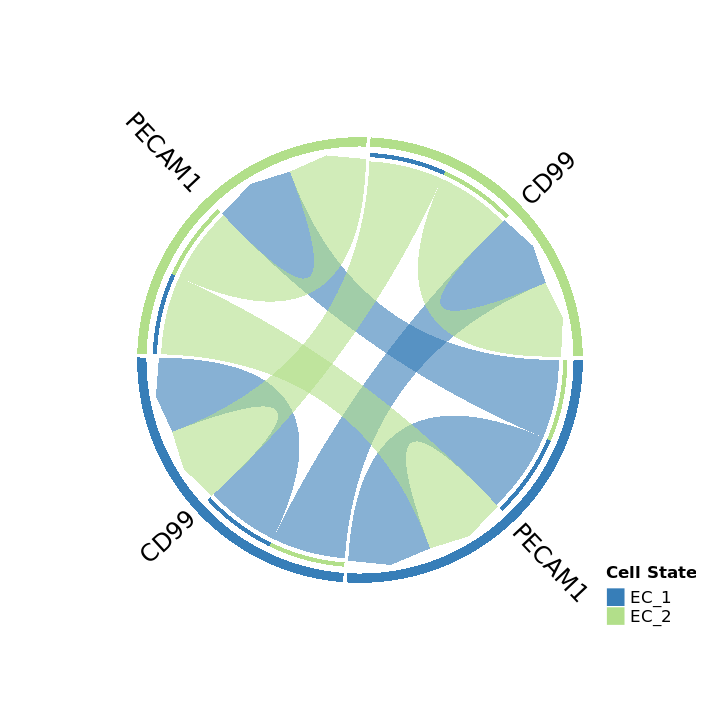

In [54]:
netVisual_chord_gene(object, net = subset_net2, sources.use = c('EC_1','EC_2'), 
                     targets.use = c('EC_1','EC_2'),legend.pos.x = 8,
                     thresh = 0.001,lab.cex = 1.2)